# Libraries
Import required libraries for network analysis, visualization, and data processing.

In [ ]:
# Install network libraries if needed
# !pip install networkx pyvis

In [1]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, count, sum as spark_sum, countDistinct

import networkx as nx
from pyvis.network import Network
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from collections import Counter
import warnings
warnings.filterwarnings('ignore')

# Spark Session & ClickHouse Configuration
Initialize Spark session and configure ClickHouse connection for data extraction.

In [2]:
CLICKHOUSE_CONFIG = {
    'host': 'localhost',
    'port': 9000,
    'database': 'public',
    'user': 'default',
    'password': 'DfsTeChB1'
}

packages = [
    "com.clickhouse.spark:clickhouse-spark-runtime-3.5_2.12:0.8.1",
    "com.clickhouse:clickhouse-client:0.9.4",
    "com.clickhouse:clickhouse-http-client:0.9.4",
    "org.apache.httpcomponents.client5:httpclient5:5.2.1"
]

spark = (SparkSession.builder
    .appName("fraud-network-analysis")
    .master("local[*]")
    .config("spark.jars.packages", ",".join(packages))
    .config("spark.executor.memory", "8g")
    .config("spark.driver.memory", "8g")
    .getOrCreate()
)

# Configure ClickHouse catalog
spark.conf.set("spark.sql.catalog.clickhouse", "com.clickhouse.spark.ClickHouseCatalog")
spark.conf.set("spark.sql.catalog.clickhouse.host", "localhost")
spark.conf.set("spark.sql.catalog.clickhouse.protocol", "http")
spark.conf.set("spark.sql.catalog.clickhouse.http_port", "8123")
spark.conf.set("spark.sql.catalog.clickhouse.user", "default")
spark.conf.set("spark.sql.catalog.clickhouse.password", "DfsTeChB1")
spark.conf.set("spark.sql.catalog.clickhouse.database", "public")

print("✅ Spark session initialized")

:: loading settings :: url = jar:file:/root/miniconda3/envs/fraud-spark/lib/python3.10/site-packages/pyspark/jars/ivy-2.5.1.jar!/org/apache/ivy/core/settings/ivysettings.xml


Ivy Default Cache set to: /root/.ivy2/cache
The jars for the packages stored in: /root/.ivy2/jars
com.clickhouse.spark#clickhouse-spark-runtime-3.5_2.12 added as a dependency
com.clickhouse#clickhouse-client added as a dependency
com.clickhouse#clickhouse-http-client added as a dependency
org.apache.httpcomponents.client5#httpclient5 added as a dependency
:: resolving dependencies :: org.apache.spark#spark-submit-parent-7406cec7-4028-4df5-869e-7a77662cbf99;1.0
	confs: [default]
	found com.clickhouse.spark#clickhouse-spark-runtime-3.5_2.12;0.8.1 in central
	found com.clickhouse#clickhouse-client;0.9.4 in central
	found com.clickhouse#clickhouse-data;0.9.4 in central
	found commons-codec#commons-codec;1.17.1 in central
	found commons-io#commons-io;2.16.1 in central
	found org.apache.commons#commons-lang3;3.18.0 in central
	found org.apache.commons#commons-compress;1.27.1 in central
	found com.clickhouse#clickhouse-http-client;0.9.4 in central
	found org.apache.httpcomponents.client5#http

✅ Spark session initialized


25/12/19 16:39:53 WARN GarbageCollectionMetrics: To enable non-built-in garbage collector(s) List(G1 Concurrent GC), users should configure it(them) to spark.eventLog.gcMetrics.youngGenerationGarbageCollectors or spark.eventLog.gcMetrics.oldGenerationGarbageCollectors


# Date Range Configuration
Set the date range for extracting transaction data.

In [4]:
START_DATE = '2025-06-01'
END_DATE = '2025-07-30'

print(f"📅 Date Range: {START_DATE} to {END_DATE}")

📅 Date Range: 2025-06-01 to 2025-07-30


# Load Transaction Data for Network Analysis
Query transaction data with sender/receiver account information for building the network graph.

In [ ]:
# Query transaction data with account relationships
# Adjust column names based on your actual table schema
network_query = f"""
    SELECT *
    FROM clickhouse.public.stixor_fraud_features_distributed
    WHERE cutoff_date BETWEEN '{START_DATE}' AND '{END_DATE}'
        AND mbar_account_type_name = 'Customer Account'
        -- AND trx_channel='NEW_JC_APP'
        -- AND trx_type='Transfer(C2C)'
        AND trx_channel='Payment Gateway'
        AND trx_type='Online Payment'
        AND ac_to IS NOT NULL 
        AND ac_to<>''
        AND start_balance<>end_balance        
        """

df_network = spark.sql(network_query)

In [6]:
df_network.show()

25/12/19 16:41:02 WARN SparkStringUtils: Truncated the string representation of a plan since it was too large. This behavior can be adjusted by setting 'spark.sql.debug.maxToStringFields'.


+-----------+--------------------+--------------------+----------+-------------------+-----------+----------+-----------+-------------+-------------+-----------+-------+--------------------+-----------+---------+-----------------------+-------------------------+---------------+--------------+--------------------+--------------------+--------------------+--------------------+-------------------+------------------+----------------------------+-----------------+-------------------+--------------------+----------------------+----------------+----------+---------+--------------+------------+----------------+-----------+-----------+----------+--------+-----------------+---------------+-------------------+------------------+--------------+------------------+-----------+-------------------+-----------------+-----------------+-----------------+------------------------+----------------------+-------------------+-----------------------+------------------------+-----------------------------+------

In [8]:
df_network.count()

82924124

In [9]:
df_network.write.mode('overwrite').parquet('june_july_jca_c2c.parquet')

25/12/19 17:02:05 WARN BasicWriteTaskStatsTracker: Expected 1 files, but only saw 0. This could be due to the output format not writing empty files, or files being not immediately visible in the filesystem.
25/12/19 17:02:17 WARN BasicWriteTaskStatsTracker: Expected 1 files, but only saw 0. This could be due to the output format not writing empty files, or files being not immediately visible in the filesystem.
25/12/19 17:04:17 WARN BasicWriteTaskStatsTracker: Expected 1 files, but only saw 0. This could be due to the output format not writing empty files, or files being not immediately visible in the filesystem.
25/12/19 17:04:37 WARN BasicWriteTaskStatsTracker: Expected 1 files, but only saw 0. This could be due to the output format not writing empty files, or files being not immediately visible in the filesystem.
25/12/19 17:05:02 WARN BasicWriteTaskStatsTracker: Expected 1 files, but only saw 0. This could be due to the output format not writing empty files, or files being not imme

Py4JJavaError: An error occurred while calling o45.parquet.
: java.io.FileNotFoundException: File file:/root/research-dir/dev/jazzcash-fraud-detection/scripts/training/june_july_jca_c2c.parquet/_temporary/0 does not exist
	at org.apache.hadoop.fs.RawLocalFileSystem.listStatus(RawLocalFileSystem.java:597)
	at org.apache.hadoop.fs.FileSystem.listStatus(FileSystem.java:1972)
	at org.apache.hadoop.fs.FileSystem.listStatus(FileSystem.java:2014)
	at org.apache.hadoop.fs.ChecksumFileSystem.listStatus(ChecksumFileSystem.java:761)
	at org.apache.hadoop.fs.FileSystem.listStatus(FileSystem.java:1972)
	at org.apache.hadoop.fs.FileSystem.listStatus(FileSystem.java:2014)
	at org.apache.hadoop.mapreduce.lib.output.FileOutputCommitter.getAllCommittedTaskPaths(FileOutputCommitter.java:334)
	at org.apache.hadoop.mapreduce.lib.output.FileOutputCommitter.commitJobInternal(FileOutputCommitter.java:404)
	at org.apache.hadoop.mapreduce.lib.output.FileOutputCommitter.commitJob(FileOutputCommitter.java:377)
	at org.apache.parquet.hadoop.ParquetOutputCommitter.commitJob(ParquetOutputCommitter.java:48)
	at org.apache.spark.internal.io.HadoopMapReduceCommitProtocol.commitJob(HadoopMapReduceCommitProtocol.scala:192)
	at org.apache.spark.sql.execution.datasources.FileFormatWriter$.$anonfun$writeAndCommit$3(FileFormatWriter.scala:275)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at org.apache.spark.util.Utils$.timeTakenMs(Utils.scala:552)
	at org.apache.spark.sql.execution.datasources.FileFormatWriter$.writeAndCommit(FileFormatWriter.scala:275)
	at org.apache.spark.sql.execution.datasources.FileFormatWriter$.executeWrite(FileFormatWriter.scala:304)
	at org.apache.spark.sql.execution.datasources.FileFormatWriter$.write(FileFormatWriter.scala:190)
	at org.apache.spark.sql.execution.datasources.InsertIntoHadoopFsRelationCommand.run(InsertIntoHadoopFsRelationCommand.scala:190)
	at org.apache.spark.sql.execution.command.DataWritingCommandExec.sideEffectResult$lzycompute(commands.scala:113)
	at org.apache.spark.sql.execution.command.DataWritingCommandExec.sideEffectResult(commands.scala:111)
	at org.apache.spark.sql.execution.command.DataWritingCommandExec.executeCollect(commands.scala:125)
	at org.apache.spark.sql.execution.QueryExecution$$anonfun$eagerlyExecuteCommands$1.$anonfun$applyOrElse$1(QueryExecution.scala:107)
	at org.apache.spark.sql.execution.SQLExecution$.$anonfun$withNewExecutionId$6(SQLExecution.scala:125)
	at org.apache.spark.sql.execution.SQLExecution$.withSQLConfPropagated(SQLExecution.scala:201)
	at org.apache.spark.sql.execution.SQLExecution$.$anonfun$withNewExecutionId$1(SQLExecution.scala:108)
	at org.apache.spark.sql.SparkSession.withActive(SparkSession.scala:900)
	at org.apache.spark.sql.execution.SQLExecution$.withNewExecutionId(SQLExecution.scala:66)
	at org.apache.spark.sql.execution.QueryExecution$$anonfun$eagerlyExecuteCommands$1.applyOrElse(QueryExecution.scala:107)
	at org.apache.spark.sql.execution.QueryExecution$$anonfun$eagerlyExecuteCommands$1.applyOrElse(QueryExecution.scala:98)
	at org.apache.spark.sql.catalyst.trees.TreeNode.$anonfun$transformDownWithPruning$1(TreeNode.scala:461)
	at org.apache.spark.sql.catalyst.trees.CurrentOrigin$.withOrigin(origin.scala:76)
	at org.apache.spark.sql.catalyst.trees.TreeNode.transformDownWithPruning(TreeNode.scala:461)
	at org.apache.spark.sql.catalyst.plans.logical.LogicalPlan.org$apache$spark$sql$catalyst$plans$logical$AnalysisHelper$$super$transformDownWithPruning(LogicalPlan.scala:32)
	at org.apache.spark.sql.catalyst.plans.logical.AnalysisHelper.transformDownWithPruning(AnalysisHelper.scala:267)
	at org.apache.spark.sql.catalyst.plans.logical.AnalysisHelper.transformDownWithPruning$(AnalysisHelper.scala:263)
	at org.apache.spark.sql.catalyst.plans.logical.LogicalPlan.transformDownWithPruning(LogicalPlan.scala:32)
	at org.apache.spark.sql.catalyst.plans.logical.LogicalPlan.transformDownWithPruning(LogicalPlan.scala:32)
	at org.apache.spark.sql.catalyst.trees.TreeNode.transformDown(TreeNode.scala:437)
	at org.apache.spark.sql.execution.QueryExecution.eagerlyExecuteCommands(QueryExecution.scala:98)
	at org.apache.spark.sql.execution.QueryExecution.commandExecuted$lzycompute(QueryExecution.scala:85)
	at org.apache.spark.sql.execution.QueryExecution.commandExecuted(QueryExecution.scala:83)
	at org.apache.spark.sql.execution.QueryExecution.assertCommandExecuted(QueryExecution.scala:142)
	at org.apache.spark.sql.DataFrameWriter.runCommand(DataFrameWriter.scala:869)
	at org.apache.spark.sql.DataFrameWriter.saveToV1Source(DataFrameWriter.scala:391)
	at org.apache.spark.sql.DataFrameWriter.saveInternal(DataFrameWriter.scala:364)
	at org.apache.spark.sql.DataFrameWriter.save(DataFrameWriter.scala:243)
	at org.apache.spark.sql.DataFrameWriter.parquet(DataFrameWriter.scala:802)
	at java.base/jdk.internal.reflect.NativeMethodAccessorImpl.invoke0(Native Method)
	at java.base/jdk.internal.reflect.NativeMethodAccessorImpl.invoke(NativeMethodAccessorImpl.java:75)
	at java.base/jdk.internal.reflect.DelegatingMethodAccessorImpl.invoke(DelegatingMethodAccessorImpl.java:52)
	at java.base/java.lang.reflect.Method.invoke(Method.java:580)
	at py4j.reflection.MethodInvoker.invoke(MethodInvoker.java:244)
	at py4j.reflection.ReflectionEngine.invoke(ReflectionEngine.java:374)
	at py4j.Gateway.invoke(Gateway.java:282)
	at py4j.commands.AbstractCommand.invokeMethod(AbstractCommand.java:132)
	at py4j.commands.CallCommand.execute(CallCommand.java:79)
	at py4j.ClientServerConnection.waitForCommands(ClientServerConnection.java:182)
	at py4j.ClientServerConnection.run(ClientServerConnection.java:106)
	at java.base/java.lang.Thread.run(Thread.java:1583)


# Data Preview & Statistics
Explore the transaction data structure and basic statistics.

In [16]:
# Basic statistics
print("📈 Transaction Statistics:")
print(f"   Total transactions: {df_network.count():,}")
print(f"   Unique senders: {df_network.select('sender').distinct().count():,}")
print(f"   Unique receivers: {df_network.select('receiver').distinct().count():,}")

# Fraud distribution
print("\n🚨 Fraud Distribution:")
df_network.groupBy('fraud_flag').count().show()

📈 Transaction Statistics:


   Total transactions: 1,057,255


   Unique senders: 363,004


   Unique receivers: 161

🚨 Fraud Distribution:


+----------+-------+
|fraud_flag|  count|
+----------+-------+
|         1|    188|
|         0|1057067|
+----------+-------+



# Convert to Pandas for Network Analysis
Convert Spark DataFrame to Pandas for NetworkX processing.

In [17]:
# Convert to Pandas
df_pd = df_network.toPandas()
print(f"✅ Converted to Pandas DataFrame: {len(df_pd):,} rows")
df_pd.head()

✅ Converted to Pandas DataFrame: 1,057,255 rows


,sender,receiver,trx_amt,fraud_flag,cutoff_date
0,+++WwZOWY2+DWNN0Xn4DIw==,Uffhm9g+mXMNEOFaS2Rtyg==,250.0,0,2025-06-01
1,+++WwZOWY2+DWNN0Xn4DIw==,DBGsA54c+M9NS+hQsW7eoA==,230.0,0,2025-06-01
2,+++WwZOWY2+DWNN0Xn4DIw==,qIBLvDpt2wXY8RIeJjqafw==,100.0,0,2025-06-01
3,+++WwZOWY2+DWNN0Xn4DIw==,DBGsA54c+M9NS+hQsW7eoA==,250.0,0,2025-06-01
4,++//mpbzREor0B4dk4NXCQ==,ctxi60+/zNi3flSNLhrd5Q==,300.0,0,2025-06-01


In [ ]:
# Convert transaction data to nodes and edges for network analysis

# Nodes: unique accounts (senders and receivers)
nodes = pd.unique(df_pd[['sender', 'receiver']].values.ravel('K'))

# Edges: each transaction as (sender, receiver, amount, fraud_flag)
edges = df_pd[['sender', 'receiver', 'trx_amt', 'fraud_flag']].copy()

print(f"✅ Extracted {len(nodes):,} unique nodes (accounts)")
print(f"✅ Extracted {len(edges):,} edges (transactions)")
edges.head()

# Build Transaction Network Graph
Create a directed graph where nodes are accounts and edges represent money transfers between them.

In [18]:
# Create directed graph
G = nx.DiGraph()

# Track fraud involvement for each account
fraud_senders = set(df_pd[df_pd['fraud_flag'] == 1]['sender'].unique())
fraud_receivers = set(df_pd[df_pd['fraud_flag'] == 1]['receiver'].unique())
fraud_accounts = fraud_senders.union(fraud_receivers)

# Add edges with aggregated weights
for _, row in df_pd.iterrows():
    sender = str(row['sender'])[:12]  # Truncate for readability
    receiver = str(row['receiver'])[:12]
    amount = float(row['trx_amt']) if pd.notna(row['trx_amt']) else 0
    is_fraud = int(row['fraud_flag']) if pd.notna(row['fraud_flag']) else 0
    
    if G.has_edge(sender, receiver):
        G[sender][receiver]['weight'] += amount
        G[sender][receiver]['count'] += 1
        G[sender][receiver]['fraud_count'] += is_fraud
    else:
        G.add_edge(sender, receiver, weight=amount, count=1, fraud_count=is_fraud)

print(f"🕸️ Network Statistics:")
print(f"   Nodes (Accounts): {G.number_of_nodes():,}")
print(f"   Edges (Transaction Relationships): {G.number_of_edges():,}")
print(f"   Fraud-involved accounts: {len(fraud_accounts):,}")

🕸️ Network Statistics:
   Nodes (Accounts): 363,165
   Edges (Transaction Relationships): 623,452
   Fraud-involved accounts: 134


# Network Centrality Analysis
Calculate centrality metrics to identify suspicious accounts with high connectivity (potential fraud hubs or mule accounts).

In [19]:
# Calculate centrality metrics
print("🔍 Calculating centrality metrics...")

in_degree = dict(G.in_degree(weight='count'))
out_degree = dict(G.out_degree(weight='count'))

# PageRank (importance based on incoming connections)
pagerank = nx.pagerank(G, weight='weight')

# Betweenness (nodes that bridge different parts of network)
# Use subset for large graphs
if G.number_of_nodes() > 1000:
    betweenness = nx.betweenness_centrality(G, k=min(500, G.number_of_nodes()))
else:
    betweenness = nx.betweenness_centrality(G)

print("✅ Centrality metrics calculated")

🔍 Calculating centrality metrics...
✅ Centrality metrics calculated


In [ ]:
# Create centrality DataFrame
centrality_df = pd.DataFrame({
    'account': list(G.nodes()),
    'in_degree': [in_degree.get(n, 0) for n in G.nodes()],
    'out_degree': [out_degree.get(n, 0) for n in G.nodes()],
    'total_degree': [in_degree.get(n, 0) + out_degree.get(n, 0) for n in G.nodes()],
    'betweenness': [betweenness.get(n, 0) for n in G.nodes()],
    'pagerank': [pagerank.get(n, 0) for n in G.nodes()]
})

# Calculate suspicion score
centrality_df['suspicion_score'] = (
    centrality_df['in_degree'].rank(pct=True) * 0.25 +
    centrality_df['out_degree'].rank(pct=True) * 0.25 +
    centrality_df['betweenness'].rank(pct=True) * 0.3 +
    centrality_df['pagerank'].rank(pct=True) * 0.2
)

print("🚨 Top 15 Most Suspicious Accounts (by network position):")
centrality_df.nlargest(15, 'suspicion_score')

# Fraud Ring Detection
Identify clusters of connected accounts that may represent organized fraud operations.

In [ ]:
# Find connected components (potential fraud rings)
wccs = list(nx.weakly_connected_components(G))

# Filter significant clusters (3+ accounts)
fraud_rings = [c for c in wccs if len(c) >= 3]
fraud_rings_sorted = sorted(fraud_rings, key=len, reverse=True)

print(f"🔗 Network Cluster Analysis:")
print(f"   Total connected components: {len(wccs):,}")
print(f"   Clusters with 3+ accounts: {len(fraud_rings):,}")
print(f"\n📊 Top 10 Largest Clusters:")
for i, ring in enumerate(fraud_rings_sorted[:10]):
    print(f"   Cluster {i+1}: {len(ring)} accounts")

# Static Network Visualization (Matplotlib)
Create a publication-ready network graph showing transaction patterns.

In [ ]:
# Create subset for visualization (top suspicious accounts)
top_accounts = centrality_df.nlargest(100, 'suspicion_score')['account'].tolist()
G_viz = G.subgraph(top_accounts).copy()

plt.figure(figsize=(16, 12))

# Layout
pos = nx.spring_layout(G_viz, k=2, iterations=50, seed=42)

# Node colors based on in-degree (money receivers)
node_colors = [in_degree.get(n, 0) for n in G_viz.nodes()]
node_sizes = [100 + pagerank.get(n, 0) * 10000 for n in G_viz.nodes()]

# Draw network
nodes = nx.draw_networkx_nodes(G_viz, pos, 
                                node_color=node_colors, 
                                cmap=plt.cm.YlOrRd, 
                                node_size=node_sizes, 
                                alpha=0.8)
nx.draw_networkx_edges(G_viz, pos, 
                        alpha=0.3, 
                        arrows=True, 
                        arrowsize=10, 
                        edge_color='gray',
                        connectionstyle="arc3,rad=0.1")

plt.colorbar(nodes, label='Incoming Transaction Count', shrink=0.8)
plt.title('🕸️ Transaction Network Graph\n(Top 100 Suspicious Accounts by Centrality)', 
          fontsize=14, fontweight='bold')
plt.axis('off')
plt.tight_layout()
plt.savefig('fraud_network_static.png', dpi=150, bbox_inches='tight', facecolor='white')
plt.show()
print("✅ Static network saved to 'fraud_network_static.png'")

# Network by Transaction Type
Visualize how different transaction types connect accounts.

In [ ]:
# Transaction type distribution
type_counts = df_pd.groupby('trx_type').agg({
    'trx_amt': ['count', 'sum', 'mean'],
    'fraud_flag': 'sum'
}).round(2)
type_counts.columns = ['transaction_count', 'total_amount', 'avg_amount', 'fraud_count']
type_counts = type_counts.sort_values('transaction_count', ascending=False)

print("📊 Transaction Types in Network:")
type_counts.head(10)

In [ ]:
# Plot transaction type distribution
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Transaction count by type
top_types = type_counts.head(10)
axes[0].barh(range(len(top_types)), top_types['transaction_count'], color='steelblue', alpha=0.8)
axes[0].set_yticks(range(len(top_types)))
axes[0].set_yticklabels(top_types.index)
axes[0].set_xlabel('Transaction Count')
axes[0].set_title('Top 10 Transaction Types by Volume', fontweight='bold')
axes[0].invert_yaxis()

# Fraud count by type
fraud_types = type_counts[type_counts['fraud_count'] > 0].sort_values('fraud_count', ascending=False).head(10)
colors = ['red' if x > fraud_types['fraud_count'].median() else 'coral' for x in fraud_types['fraud_count']]
axes[1].barh(range(len(fraud_types)), fraud_types['fraud_count'], color=colors, alpha=0.8)
axes[1].set_yticks(range(len(fraud_types)))
axes[1].set_yticklabels(fraud_types.index)
axes[1].set_xlabel('Fraud Transaction Count')
axes[1].set_title('Top Transaction Types with Fraud Cases', fontweight='bold')
axes[1].invert_yaxis()

plt.tight_layout()
plt.savefig('transaction_type_analysis.png', dpi=150, bbox_inches='tight', facecolor='white')
plt.show()

# Channel Distribution Analysis
Analyze which channels are used in the transaction network.

In [ ]:
# Channel analysis
channel_counts = df_pd.groupby('trx_channel').agg({
    'trx_amt': ['count', 'sum'],
    'fraud_flag': 'sum'
}).round(2)
channel_counts.columns = ['transaction_count', 'total_amount', 'fraud_count']
channel_counts['fraud_rate'] = (channel_counts['fraud_count'] / channel_counts['transaction_count'] * 100).round(4)
channel_counts = channel_counts.sort_values('transaction_count', ascending=False)

print("📱 Channel Distribution:")
channel_counts.head(10)

# Interactive Network Visualization (PyVis)
Create an interactive HTML graph for exploring transaction relationships.

In [ ]:
# Create interactive network with PyVis
# Use top suspicious accounts for better visualization
top_nodes = centrality_df.nlargest(75, 'suspicion_score')['account'].tolist()
G_sub = G.subgraph(top_nodes).copy()

# Create PyVis network
net = Network(height='700px', width='100%', bgcolor='#1a1a2e', font_color='white', directed=True)

# Add nodes with styling
for node in G_sub.nodes():
    score = centrality_df[centrality_df['account'] == node]['suspicion_score'].values
    in_deg = in_degree.get(node, 0)
    out_deg = out_degree.get(node, 0)
    
    size = 15 + (score[0] * 25 if len(score) > 0 else 10)
    
    # Color based on role: red=high in-degree (receivers), blue=high out-degree (senders)
    if in_deg > out_deg * 1.5:
        color = '#ff6b6b'  # Red - money collector
        role = 'Receiver'
    elif out_deg > in_deg * 1.5:
        color = '#4ecdc4'  # Teal - money sender
        role = 'Sender'
    else:
        color = '#f9ca24'  # Yellow - balanced
        role = 'Balanced'
    
    title = f"Account: {node}\nIn-Degree: {in_deg}\nOut-Degree: {out_deg}\nRole: {role}"
    net.add_node(node, size=size, color=color, title=title, label=node[:8])

# Add edges
for u, v, data in G_sub.edges(data=True):
    edge_color = '#ff4757' if data.get('fraud_count', 0) > 0 else '#636e72'
    title = f"Transactions: {data.get('count', 1)}\nTotal Amount: {data.get('weight', 0):,.0f}"
    net.add_edge(u, v, value=data.get('count', 1), title=title, color=edge_color)

# Configure physics for better layout
net.set_options("""
var options = {
  "physics": {
    "forceAtlas2Based": {
      "gravitationalConstant": -100,
      "springLength": 150,
      "springConstant": 0.08
    },
    "solver": "forceAtlas2Based",
    "stabilization": {"iterations": 100}
  },
  "edges": {
    "smooth": {"type": "curvedCW", "roundness": 0.2}
  }
}
""")

# Save interactive graph
net.save_graph('fraud_network_interactive.html')
print("✅ Interactive network saved to 'fraud_network_interactive.html'")
print("   📍 Red nodes = Money receivers (high in-degree)")
print("   📍 Teal nodes = Money senders (high out-degree)")
print("   📍 Yellow nodes = Balanced activity")
print("   📍 Red edges = Fraud-flagged transactions")

In [ ]:
# Display the interactive network (if running in Jupyter)
from IPython.display import IFrame
IFrame('fraud_network_interactive.html', width='100%', height=750)

# Degree Distribution Analysis
Analyze the distribution of connections to identify anomalies.

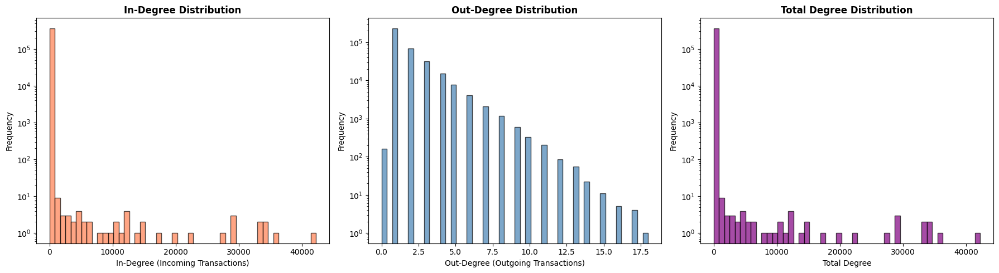

In [25]:
# Degree distribution plots
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# In-degree distribution
in_degrees = [d for n, d in G.in_degree()]
axes[0].hist(in_degrees, bins=50, color='coral', alpha=0.7, edgecolor='black')
axes[0].set_xlabel('In-Degree (Incoming Transactions)')
axes[0].set_ylabel('Frequency')
axes[0].set_title('In-Degree Distribution', fontweight='bold')
axes[0].set_yscale('log')

# Out-degree distribution
out_degrees = [d for n, d in G.out_degree()]
axes[1].hist(out_degrees, bins=50, color='steelblue', alpha=0.7, edgecolor='black')
axes[1].set_xlabel('Out-Degree (Outgoing Transactions)')
axes[1].set_ylabel('Frequency')
axes[1].set_title('Out-Degree Distribution', fontweight='bold')
axes[1].set_yscale('log')

# Total degree distribution
total_degrees = [in_degrees[i] + out_degrees[i] for i in range(len(in_degrees))]
axes[2].hist(total_degrees, bins=50, color='purple', alpha=0.7, edgecolor='black')
axes[2].set_xlabel('Total Degree')
axes[2].set_ylabel('Frequency')
axes[2].set_title('Total Degree Distribution', fontweight='bold')
axes[2].set_yscale('log')

plt.tight_layout()
plt.savefig('degree_distribution.png', dpi=150, bbox_inches='tight', facecolor='white')
plt.show()

# Summary Statistics
Network analysis summary and key findings.

In [26]:
# Network summary
print("="*60)
print("📊 NETWORK ANALYSIS SUMMARY")
print("="*60)
print(f"\n🕸️ Network Structure:")
print(f"   Total Accounts (Nodes): {G.number_of_nodes():,}")
print(f"   Total Relationships (Edges): {G.number_of_edges():,}")
print(f"   Network Density: {nx.density(G):.6f}")

print(f"\n📈 Centrality Statistics:")
print(f"   Avg In-Degree: {np.mean(in_degrees):.2f}")
print(f"   Max In-Degree: {np.max(in_degrees):,}")
print(f"   Avg Out-Degree: {np.mean(out_degrees):.2f}")
print(f"   Max Out-Degree: {np.max(out_degrees):,}")

print(f"\n🔗 Cluster Analysis:")
print(f"   Connected Components: {len(wccs):,}")
print(f"   Large Clusters (3+ accounts): {len(fraud_rings):,}")
if fraud_rings_sorted:
    print(f"   Largest Cluster Size: {len(fraud_rings_sorted[0])} accounts")

print(f"\n🚨 Fraud Involvement:")
print(f"   Fraud-involved accounts: {len(fraud_accounts):,}")
print(f"   Fraud transactions in network: {df_pd['fraud_flag'].sum():,}")

print("\n" + "="*60)
print("✅ Analysis Complete!")
print("   📄 Static graph: fraud_network_static.png")
print("   🌐 Interactive graph: fraud_network_interactive.html")
print("="*60)

📊 NETWORK ANALYSIS SUMMARY

🕸️ Network Structure:
   Total Accounts (Nodes): 363,165
   Total Relationships (Edges): 623,452
   Total Relationships (Edges): 623,452
   Network Density: 0.000005

📈 Centrality Statistics:
   Avg In-Degree: 1.72
   Max In-Degree: 42,230
   Avg Out-Degree: 1.72
   Max Out-Degree: 18

🔗 Cluster Analysis:
   Connected Components: 43
   Large Clusters (3+ accounts): 27
   Largest Cluster Size: 362958 accounts

🚨 Fraud Involvement:
   Fraud-involved accounts: 134
   Fraud transactions in network: 188

✅ Analysis Complete!
   📄 Static graph: fraud_network_static.png
   🌐 Interactive graph: fraud_network_interactive.html
   Network Density: 0.000005

📈 Centrality Statistics:
   Avg In-Degree: 1.72
   Max In-Degree: 42,230
   Avg Out-Degree: 1.72
   Max Out-Degree: 18

🔗 Cluster Analysis:
   Connected Components: 43
   Large Clusters (3+ accounts): 27
   Largest Cluster Size: 362958 accounts

🚨 Fraud Involvement:
   Fraud-involved accounts: 134
   Fraud transacti

In [ ]:
# Stop Spark session when done
# spark.stop()
# print("✅ Spark session stopped")

# ═══════════════════════════════════════════════════════════════════════════
# FRAUD-FOCUSED NETWORK ANALYSIS WITH INTERACTIVE WIDGETS
# ═══════════════════════════════════════════════════════════════════════════
Visualize only fraud accounts and their networks with pattern detection, interactive filtering, and detailed annotations.

# Install Interactive Widget Libraries
Install ipywidgets and plotly for interactive visualizations.

In [31]:
# Install required libraries for interactive widgets (run once)
!pip install ipywidgets plotly kaleido

  Using cached pytest_timeout-2.4.0-py3-none-any.whl.metadata (20 kB)
  Using cached pytest_timeout-2.4.0-py3-none-any.whl.metadata (20 kB)
  Using cached simplejson-3.20.2-cp310-cp310-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (3.2 kB)
  Using cached simplejson-3.20.2-cp310-cp310-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (3.2 kB)
  Using cached iniconfig-2.3.0-py3-none-any.whl.metadata (2.5 kB)
  Using cached iniconfig-2.3.0-py3-none-any.whl.metadata (2.5 kB)
  Using cached pluggy-1.6.0-py3-none-any.whl.metadata (4.8 kB)
  Using cached pluggy-1.6.0-py3-none-any.whl.metadata (4.8 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/9.9 MB ? eta -:--:--Downloading plotly-6.5.0-py3-none-any.whl (9.9 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 19.3 MB/s  0:00:00 eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 19.3 MB/s  0:00:00
Using cached pytest_timeo

In [35]:
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import ipywidgets as widgets
from IPython.display import display, HTML, clear_output
import json

print("✅ Interactive libraries imported")

✅ Interactive libraries imported


# Build Fraud-Only Network
Extract only fraud transactions and their connected accounts to create a focused fraud network.

In [27]:
# ═══════════════════════════════════════════════════════════════════════════
# BUILD FRAUD-ONLY NETWORK
# ═══════════════════════════════════════════════════════════════════════════

# Filter only fraud transactions
df_fraud_only = df_pd[df_pd['fraud_flag'] == 1].copy()
print(f"🚨 Fraud Transactions: {len(df_fraud_only):,}")

# Get all accounts involved in fraud (senders and receivers)
fraud_senders_set = set(df_fraud_only['sender'].dropna().unique())
fraud_receivers_set = set(df_fraud_only['receiver'].dropna().unique())
all_fraud_accounts = fraud_senders_set.union(fraud_receivers_set)

print(f"   Fraud Senders: {len(fraud_senders_set):,}")
print(f"   Fraud Receivers: {len(fraud_receivers_set):,}")
print(f"   Total Fraud-Involved Accounts: {len(all_fraud_accounts):,}")

# Create fraud-only network
G_fraud = nx.DiGraph()

# Add edges for fraud transactions only
for _, row in df_fraud_only.iterrows():
    sender = str(row['sender'])[:15] if pd.notna(row['sender']) else 'Unknown'
    receiver = str(row['receiver'])[:15] if pd.notna(row['receiver']) else 'Unknown'
    amount = float(row['trx_amt']) if pd.notna(row['trx_amt']) else 0
    
    if sender != 'Unknown' and receiver != 'Unknown':
        if G_fraud.has_edge(sender, receiver):
            G_fraud[sender][receiver]['weight'] += amount
            G_fraud[sender][receiver]['count'] += 1
            G_fraud[sender][receiver]['amounts'].append(amount)
        else:
            G_fraud.add_edge(sender, receiver, weight=amount, count=1, amounts=[amount])

# Add node attributes
for node in G_fraud.nodes():
    full_node = [acc for acc in all_fraud_accounts if str(acc)[:15] == node]
    is_sender = node in [str(s)[:15] for s in fraud_senders_set]
    is_receiver = node in [str(r)[:15] for r in fraud_receivers_set]
    
    if is_sender and is_receiver:
        G_fraud.nodes[node]['role'] = 'Both'
        G_fraud.nodes[node]['color'] = '#9b59b6'  # Purple
    elif is_sender:
        G_fraud.nodes[node]['role'] = 'Sender'
        G_fraud.nodes[node]['color'] = '#e74c3c'  # Red
    else:
        G_fraud.nodes[node]['role'] = 'Receiver'
        G_fraud.nodes[node]['color'] = '#3498db'  # Blue

print(f"\n🕸️ Fraud Network Statistics:")
print(f"   Nodes: {G_fraud.number_of_nodes():,}")
print(f"   Edges: {G_fraud.number_of_edges():,}")

🚨 Fraud Transactions: 188
   Fraud Senders: 110
   Fraud Receivers: 24
   Total Fraud-Involved Accounts: 134

🕸️ Fraud Network Statistics:
   Nodes: 134
   Edges: 144


# Fraud Network Pattern Detection
Identify common fraud patterns: Star patterns (one-to-many), Chain patterns (sequential), Ring patterns (circular), and Hub patterns (high centrality).

In [28]:
# ═══════════════════════════════════════════════════════════════════════════
# FRAUD PATTERN DETECTION
# ═══════════════════════════════════════════════════════════════════════════

def detect_fraud_patterns(G):
    """Detect common fraud network patterns"""
    patterns = {
        'star_senders': [],      # One account sending to many (money laundering)
        'star_receivers': [],    # One account receiving from many (collection point)
        'chains': [],            # Sequential transfers (layering)
        'rings': [],             # Circular transfers
        'hubs': []               # High betweenness centrality
    }
    
    # 1. STAR PATTERN - Senders (one-to-many): High out-degree
    for node in G.nodes():
        out_deg = G.out_degree(node)
        in_deg = G.in_degree(node)
        
        if out_deg >= 3:  # Sending to 3+ different accounts
            total_sent = sum([G[node][succ]['weight'] for succ in G.successors(node)])
            patterns['star_senders'].append({
                'account': node,
                'recipients': out_deg,
                'total_amount': total_sent,
                'pattern': 'STAR_SENDER'
            })
        
        # 2. STAR PATTERN - Receivers (many-to-one): High in-degree  
        if in_deg >= 3:  # Receiving from 3+ different accounts
            total_received = sum([G[pred][node]['weight'] for pred in G.predecessors(node)])
            patterns['star_receivers'].append({
                'account': node,
                'sources': in_deg,
                'total_amount': total_received,
                'pattern': 'STAR_RECEIVER'
            })
    
    # 3. CHAIN PATTERN - Sequential transfers
    for node in G.nodes():
        if G.in_degree(node) == 1 and G.out_degree(node) == 1:
            pred = list(G.predecessors(node))[0]
            succ = list(G.successors(node))[0]
            if pred != succ:  # Not a simple back-and-forth
                patterns['chains'].append({
                    'account': node,
                    'from': pred,
                    'to': succ,
                    'pattern': 'CHAIN_NODE'
                })
    
    # 4. RING/CYCLE DETECTION
    try:
        cycles = list(nx.simple_cycles(G))
        for cycle in cycles[:20]:  # Limit to first 20 cycles
            if len(cycle) >= 3:
                patterns['rings'].append({
                    'accounts': cycle,
                    'size': len(cycle),
                    'pattern': 'RING'
                })
    except:
        pass
    
    # 5. HUB DETECTION - High betweenness centrality
    if G.number_of_nodes() > 0:
        betweenness = nx.betweenness_centrality(G)
        threshold = np.percentile(list(betweenness.values()), 90) if betweenness else 0
        for node, score in betweenness.items():
            if score >= threshold and score > 0:
                patterns['hubs'].append({
                    'account': node,
                    'betweenness': score,
                    'pattern': 'HUB'
                })
    
    return patterns

# Detect patterns
fraud_patterns = detect_fraud_patterns(G_fraud)

print("🔍 FRAUD PATTERN DETECTION RESULTS")
print("="*60)
print(f"\n⭐ STAR SENDERS (One-to-Many): {len(fraud_patterns['star_senders'])}")
for p in sorted(fraud_patterns['star_senders'], key=lambda x: x['recipients'], reverse=True)[:5]:
    print(f"   • {p['account']}: sent to {p['recipients']} accounts, total: PKR {p['total_amount']:,.0f}")

print(f"\n⭐ STAR RECEIVERS (Many-to-One): {len(fraud_patterns['star_receivers'])}")
for p in sorted(fraud_patterns['star_receivers'], key=lambda x: x['sources'], reverse=True)[:5]:
    print(f"   • {p['account']}: received from {p['sources']} accounts, total: PKR {p['total_amount']:,.0f}")

print(f"\n🔗 CHAIN NODES (Pass-Through): {len(fraud_patterns['chains'])}")
for p in fraud_patterns['chains'][:5]:
    print(f"   • {p['from']} → {p['account']} → {p['to']}")

print(f"\n🔄 RING PATTERNS (Circular): {len(fraud_patterns['rings'])}")
for p in fraud_patterns['rings'][:3]:
    print(f"   • Cycle of {p['size']} accounts: {' → '.join(p['accounts'][:4])}...")

print(f"\n🎯 HUB ACCOUNTS (High Centrality): {len(fraud_patterns['hubs'])}")
for p in sorted(fraud_patterns['hubs'], key=lambda x: x['betweenness'], reverse=True)[:5]:
    print(f"   • {p['account']}: betweenness = {p['betweenness']:.4f}")

🔍 FRAUD PATTERN DETECTION RESULTS

⭐ STAR SENDERS (One-to-Many): 4
   • pMPXrdf+3GiV1h/: sent to 4 accounts, total: PKR 17,400
   • STS6TQoiOGAMv9b: sent to 3 accounts, total: PKR 31,000
   • XMKYqg0Z+2oYIMt: sent to 3 accounts, total: PKR 22,300
   • 2g8NU+vMjJv8ZuR: sent to 3 accounts, total: PKR 20,720

⭐ STAR RECEIVERS (Many-to-One): 18
   • 3B6Pjask3gqiQXJ: received from 16 accounts, total: PKR 298,648
   • ipHd6ej3IniylMa: received from 16 accounts, total: PKR 115,307
   • qrllA1XT4j0+mwx: received from 16 accounts, total: PKR 171,133
   • DBGsA54c+M9NS+h: received from 15 accounts, total: PKR 172,272
   • ctxi60+/zNi3flS: received from 11 accounts, total: PKR 206,100

🔗 CHAIN NODES (Pass-Through): 0

🔄 RING PATTERNS (Circular): 0

🎯 HUB ACCOUNTS (High Centrality): 0


# Create Pattern Summary DataFrame
Compile all detected patterns into a DataFrame for analysis and filtering.

In [29]:
# Create comprehensive node DataFrame with pattern flags
node_data = []
for node in G_fraud.nodes():
    in_deg = G_fraud.in_degree(node)
    out_deg = G_fraud.out_degree(node)
    
    # Calculate amounts
    total_sent = sum([G_fraud[node][succ]['weight'] for succ in G_fraud.successors(node)]) if out_deg > 0 else 0
    total_received = sum([G_fraud[pred][node]['weight'] for pred in G_fraud.predecessors(node)]) if in_deg > 0 else 0
    
    # Pattern flags
    is_star_sender = any(p['account'] == node for p in fraud_patterns['star_senders'])
    is_star_receiver = any(p['account'] == node for p in fraud_patterns['star_receivers'])
    is_chain = any(p['account'] == node for p in fraud_patterns['chains'])
    is_hub = any(p['account'] == node for p in fraud_patterns['hubs'])
    is_ring = any(node in p['accounts'] for p in fraud_patterns['rings'])
    
    # Determine primary pattern
    patterns_list = []
    if is_star_sender: patterns_list.append('Star Sender')
    if is_star_receiver: patterns_list.append('Star Receiver')
    if is_chain: patterns_list.append('Chain')
    if is_hub: patterns_list.append('Hub')
    if is_ring: patterns_list.append('Ring')
    
    node_data.append({
        'account': node,
        'role': G_fraud.nodes[node].get('role', 'Unknown'),
        'in_degree': in_deg,
        'out_degree': out_deg,
        'total_degree': in_deg + out_deg,
        'total_sent': total_sent,
        'total_received': total_received,
        'net_flow': total_received - total_sent,
        'is_star_sender': is_star_sender,
        'is_star_receiver': is_star_receiver,
        'is_chain': is_chain,
        'is_hub': is_hub,
        'is_ring': is_ring,
        'patterns': ', '.join(patterns_list) if patterns_list else 'None',
        'pattern_count': len(patterns_list)
    })

fraud_node_df = pd.DataFrame(node_data)
fraud_node_df = fraud_node_df.sort_values('total_degree', ascending=False)

print("📊 Fraud Account Summary:")
print(f"   Total accounts: {len(fraud_node_df)}")
print(f"   Accounts with patterns: {(fraud_node_df['pattern_count'] > 0).sum()}")
display(fraud_node_df.head(15))

📊 Fraud Account Summary:
   Total accounts: 134
   Accounts with patterns: 22


,account,role,in_degree,out_degree,total_degree,total_sent,total_received,net_flow,is_star_sender,is_star_receiver,is_chain,is_hub,is_ring,patterns,pattern_count
1,3B6Pjask3gqiQXJ,Receiver,16,0,16,0.0,298648.0,298648.0,False,True,False,False,False,Star Receiver,1
8,ipHd6ej3IniylMa,Receiver,16,0,16,0.0,115307.0,115307.0,False,True,False,False,False,Star Receiver,1
26,qrllA1XT4j0+mwx,Receiver,16,0,16,0.0,171133.0,171133.0,False,True,False,False,False,Star Receiver,1
12,DBGsA54c+M9NS+h,Receiver,15,0,15,0.0,172272.0,172272.0,False,True,False,False,False,Star Receiver,1
3,ctxi60+/zNi3flS,Receiver,11,0,11,0.0,206100.0,206100.0,False,True,False,False,False,Star Receiver,1
5,Uffhm9g+mXMNEOF,Receiver,9,0,9,0.0,117400.0,117400.0,False,True,False,False,False,Star Receiver,1
74,fpXFg4v2eFe8bBd,Receiver,7,0,7,0.0,130673.0,130673.0,False,True,False,False,False,Star Receiver,1
24,fPgIKI/bJEDGPQ8,Receiver,6,0,6,0.0,256100.0,256100.0,False,True,False,False,False,Star Receiver,1
18,NmIMpLA7/OygnFX,Receiver,6,0,6,0.0,61651.0,61651.0,False,True,False,False,False,Star Receiver,1
17,anj52rpehkmJKg5,Receiver,5,0,5,0.0,68500.0,68500.0,False,True,False,False,False,Star Receiver,1


# Interactive Plotly Network Visualization
Create an interactive network graph with Plotly showing fraud accounts with hover details and pattern highlighting.

In [33]:
# ═══════════════════════════════════════════════════════════════════════════
# INTERACTIVE PLOTLY NETWORK VISUALIZATION
# ═══════════════════════════════════════════════════════════════════════════

import plotly.graph_objects as go

def create_plotly_fraud_network(G, node_df, title="Fraud Network"):
    """Create interactive Plotly network visualization"""
    
    # Use spring layout for node positions
    pos = nx.spring_layout(G, k=2, iterations=100, seed=42)
    
    # Create edge traces
    edge_x = []
    edge_y = []
    edge_colors = []
    edge_hover = []
    
    for edge in G.edges(data=True):
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x.extend([x0, x1, None])
        edge_y.extend([y0, y1, None])
        
        # Edge info for hover
        count = edge[2].get('count', 1)
        amount = edge[2].get('weight', 0)
        edge_hover.append(f"{edge[0]} → {edge[1]}<br>Transactions: {count}<br>Amount: PKR {amount:,.0f}")
    
    edge_trace = go.Scatter(
        x=edge_x, y=edge_y,
        line=dict(width=0.8, color='rgba(150,150,150,0.5)'),
        hoverinfo='none',
        mode='lines'
    )
    
    # Create node traces by pattern type
    node_traces = []
    
    # Color mapping for patterns
    pattern_colors = {
        'Star Sender': '#e74c3c',      # Red
        'Star Receiver': '#3498db',     # Blue  
        'Hub': '#f39c12',               # Orange
        'Chain': '#9b59b6',             # Purple
        'Ring': '#1abc9c',              # Teal
        'None': '#95a5a6'               # Gray
    }
    
    # Group nodes by their primary pattern
    for pattern_name, color in pattern_colors.items():
        if pattern_name == 'None':
            pattern_nodes = node_df[node_df['patterns'] == 'None']['account'].tolist()
        else:
            pattern_nodes = node_df[node_df['patterns'].str.contains(pattern_name, na=False)]['account'].tolist()
        
        if not pattern_nodes:
            continue
            
        node_x = [pos[n][0] for n in pattern_nodes if n in pos]
        node_y = [pos[n][1] for n in pattern_nodes if n in pos]
        
        # Node info for hover
        hover_texts = []
        sizes = []
        for node in pattern_nodes:
            if node in pos:
                node_info = node_df[node_df['account'] == node].iloc[0]
                hover_text = (
                    f"<b>Account:</b> {node}<br>"
                    f"<b>Role:</b> {node_info['role']}<br>"
                    f"<b>Pattern:</b> {node_info['patterns']}<br>"
                    f"<b>In-Degree:</b> {node_info['in_degree']}<br>"
                    f"<b>Out-Degree:</b> {node_info['out_degree']}<br>"
                    f"<b>Total Sent:</b> PKR {node_info['total_sent']:,.0f}<br>"
                    f"<b>Total Received:</b> PKR {node_info['total_received']:,.0f}<br>"
                    f"<b>Net Flow:</b> PKR {node_info['net_flow']:,.0f}"
                )
                hover_texts.append(hover_text)
                sizes.append(10 + node_info['total_degree'] * 3)
        
        node_trace = go.Scatter(
            x=node_x, y=node_y,
            mode='markers',
            name=pattern_name,
            marker=dict(
                size=sizes if sizes else [15],
                color=color,
                line=dict(width=2, color='white'),
                symbol='circle'
            ),
            text=hover_texts,
            hoverinfo='text',
            hovertemplate='%{text}<extra></extra>'
        )
        node_traces.append(node_trace)
    
    # Create figure
    fig = go.Figure(data=[edge_trace] + node_traces)
    
    fig.update_layout(
        title=dict(
            text=f"<b>🚨 {title}</b><br><sub>Hover over nodes for details | Click legend to filter patterns</sub>",
            x=0.5,
            font=dict(size=18)
        ),
        showlegend=True,
        legend=dict(
            title="<b>Pattern Type</b>",
            itemsizing='constant',
            font=dict(size=11)
        ),
        hovermode='closest',
        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
        yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
        plot_bgcolor='rgba(240,240,240,0.9)',
        paper_bgcolor='white',
        height=700,
        margin=dict(l=20, r=20, t=80, b=20)
    )
    
    # Add annotations for key statistics
    fig.add_annotation(
        x=0.02, y=0.98,
        xref='paper', yref='paper',
        text=f"<b>Nodes:</b> {G.number_of_nodes()} | <b>Edges:</b> {G.number_of_edges()}",
        showarrow=False,
        font=dict(size=11),
        bgcolor='white',
        bordercolor='gray',
        borderwidth=1
    )
    
    return fig

# Create and display the interactive network
fig_network = create_plotly_fraud_network(G_fraud, fraud_node_df, "Fraud Transaction Network")
fig_network.show()

# Interactive Widget Dashboard
Create a dashboard with dropdown filters, sliders, and buttons to explore fraud patterns interactively.

In [36]:
# ═══════════════════════════════════════════════════════════════════════════
# INTERACTIVE WIDGET DASHBOARD
# ═══════════════════════════════════════════════════════════════════════════

# Create widgets
pattern_dropdown = widgets.Dropdown(
    options=['All Patterns', 'Star Sender', 'Star Receiver', 'Hub', 'Chain', 'Ring', 'None'],
    value='All Patterns',
    description='Pattern:',
    style={'description_width': '80px'}
)

role_dropdown = widgets.Dropdown(
    options=['All Roles', 'Sender', 'Receiver', 'Both'],
    value='All Roles',
    description='Role:',
    style={'description_width': '80px'}
)

min_degree_slider = widgets.IntSlider(
    value=1,
    min=1,
    max=max(fraud_node_df['total_degree'].max(), 10),
    step=1,
    description='Min Degree:',
    style={'description_width': '80px'}
)

min_amount_slider = widgets.FloatSlider(
    value=0,
    min=0,
    max=fraud_node_df['total_sent'].max() if len(fraud_node_df) > 0 else 100000,
    step=1000,
    description='Min Amount:',
    style={'description_width': '80px'},
    readout_format=',.0f'
)

# Output widget for displaying results
output_widget = widgets.Output()

def update_display(change=None):
    """Update the display based on filter selections"""
    with output_widget:
        clear_output(wait=True)
        
        # Filter data
        filtered_df = fraud_node_df.copy()
        
        # Pattern filter
        if pattern_dropdown.value != 'All Patterns':
            if pattern_dropdown.value == 'None':
                filtered_df = filtered_df[filtered_df['patterns'] == 'None']
            else:
                filtered_df = filtered_df[filtered_df['patterns'].str.contains(pattern_dropdown.value, na=False)]
        
        # Role filter
        if role_dropdown.value != 'All Roles':
            filtered_df = filtered_df[filtered_df['role'] == role_dropdown.value]
        
        # Degree filter
        filtered_df = filtered_df[filtered_df['total_degree'] >= min_degree_slider.value]
        
        # Amount filter
        filtered_df = filtered_df[(filtered_df['total_sent'] >= min_amount_slider.value) | 
                                   (filtered_df['total_received'] >= min_amount_slider.value)]
        
        # Display summary
        print("="*70)
        print(f"🔍 FILTERED RESULTS: {len(filtered_df)} accounts")
        print("="*70)
        
        if len(filtered_df) > 0:
            print(f"\n📊 Summary Statistics:")
            print(f"   Total Sent: PKR {filtered_df['total_sent'].sum():,.0f}")
            print(f"   Total Received: PKR {filtered_df['total_received'].sum():,.0f}")
            print(f"   Avg Degree: {filtered_df['total_degree'].mean():.1f}")
            
            print(f"\n📋 Pattern Distribution:")
            for pattern in ['Star Sender', 'Star Receiver', 'Hub', 'Chain', 'Ring']:
                count = filtered_df['patterns'].str.contains(pattern, na=False).sum()
                if count > 0:
                    print(f"   • {pattern}: {count}")
            
            print(f"\n👤 Role Distribution:")
            print(filtered_df['role'].value_counts().to_string())
            
            print(f"\n📄 Top 10 Accounts:")
            display(filtered_df[['account', 'role', 'patterns', 'in_degree', 'out_degree', 
                                 'total_sent', 'total_received']].head(10))
            
            # Create subgraph for filtered nodes
            filtered_nodes = filtered_df['account'].tolist()
            if len(filtered_nodes) > 0 and len(filtered_nodes) <= 100:
                G_filtered = G_fraud.subgraph(filtered_nodes).copy()
                if G_filtered.number_of_nodes() > 0:
                    fig = create_plotly_fraud_network(G_filtered, filtered_df, 
                                                       f"Filtered Network ({len(filtered_nodes)} accounts)")
                    fig.show()
        else:
            print("\n⚠️ No accounts match the current filters. Try adjusting the criteria.")

# Connect widgets to update function
pattern_dropdown.observe(update_display, names='value')
role_dropdown.observe(update_display, names='value')
min_degree_slider.observe(update_display, names='value')
min_amount_slider.observe(update_display, names='value')

# Create dashboard layout
dashboard_title = widgets.HTML(
    value="<h2 style='color: #2c3e50; margin-bottom: 10px;'>🎛️ Fraud Network Filter Dashboard</h2>"
)

filter_box = widgets.VBox([
    widgets.HBox([pattern_dropdown, role_dropdown]),
    widgets.HBox([min_degree_slider, min_amount_slider])
], layout=widgets.Layout(padding='10px', border='1px solid #ddd', margin='10px 0'))

dashboard = widgets.VBox([dashboard_title, filter_box, output_widget])

# Display dashboard
display(dashboard)

# Initial display
update_display()

# Pattern-Specific Visualizations
Detailed visualizations for each fraud pattern type with annotations.

In [37]:
# ═══════════════════════════════════════════════════════════════════════════
# PATTERN-SPECIFIC VISUALIZATIONS WITH ANNOTATIONS
# ═══════════════════════════════════════════════════════════════════════════

# Create subplots for different pattern analyses
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=(
        '⭐ Star Senders (Money Laundering Risk)',
        '⭐ Star Receivers (Collection Points)',
        '🎯 Hub Accounts (High Centrality)',
        '📊 Account Role Distribution'
    ),
    specs=[[{"type": "bar"}, {"type": "bar"}],
           [{"type": "bar"}, {"type": "pie"}]]
)

# 1. Star Senders
star_senders_df = fraud_node_df[fraud_node_df['is_star_sender']].nlargest(10, 'out_degree')
if len(star_senders_df) > 0:
    fig.add_trace(
        go.Bar(
            x=star_senders_df['account'],
            y=star_senders_df['out_degree'],
            marker_color='#e74c3c',
            text=star_senders_df['out_degree'],
            textposition='outside',
            name='Star Senders',
            hovertemplate='<b>%{x}</b><br>Recipients: %{y}<br>Sent: PKR %{customdata:,.0f}<extra></extra>',
            customdata=star_senders_df['total_sent']
        ),
        row=1, col=1
    )

# 2. Star Receivers
star_receivers_df = fraud_node_df[fraud_node_df['is_star_receiver']].nlargest(10, 'in_degree')
if len(star_receivers_df) > 0:
    fig.add_trace(
        go.Bar(
            x=star_receivers_df['account'],
            y=star_receivers_df['in_degree'],
            marker_color='#3498db',
            text=star_receivers_df['in_degree'],
            textposition='outside',
            name='Star Receivers',
            hovertemplate='<b>%{x}</b><br>Sources: %{y}<br>Received: PKR %{customdata:,.0f}<extra></extra>',
            customdata=star_receivers_df['total_received']
        ),
        row=1, col=2
    )

# 3. Hub Accounts
hub_df = fraud_node_df[fraud_node_df['is_hub']].nlargest(10, 'total_degree')
if len(hub_df) > 0:
    fig.add_trace(
        go.Bar(
            x=hub_df['account'],
            y=hub_df['total_degree'],
            marker_color='#f39c12',
            text=hub_df['total_degree'],
            textposition='outside',
            name='Hub Accounts',
            hovertemplate='<b>%{x}</b><br>Total Connections: %{y}<extra></extra>'
        ),
        row=2, col=1
    )

# 4. Role Distribution Pie
role_counts = fraud_node_df['role'].value_counts()
fig.add_trace(
    go.Pie(
        labels=role_counts.index,
        values=role_counts.values,
        marker_colors=['#e74c3c', '#3498db', '#9b59b6'],
        textinfo='label+percent',
        hovertemplate='<b>%{label}</b><br>Count: %{value}<br>Percentage: %{percent}<extra></extra>'
    ),
    row=2, col=2
)

fig.update_layout(
    height=800,
    title=dict(
        text='<b>🔍 Fraud Pattern Analysis Dashboard</b>',
        x=0.5,
        font=dict(size=18)
    ),
    showlegend=False,
    paper_bgcolor='white',
    plot_bgcolor='rgba(240,240,240,0.5)'
)

fig.update_xaxes(tickangle=45)
fig.show()

# Money Flow Sankey Diagram
Visualize money flow between fraud accounts using a Sankey diagram.

In [38]:
# ═══════════════════════════════════════════════════════════════════════════
# MONEY FLOW SANKEY DIAGRAM
# ═══════════════════════════════════════════════════════════════════════════

# Get top edges by transaction count for Sankey
edges_data = []
for u, v, data in G_fraud.edges(data=True):
    edges_data.append({
        'source': u,
        'target': v,
        'count': data.get('count', 1),
        'amount': data.get('weight', 0)
    })

edges_df = pd.DataFrame(edges_data)
if len(edges_df) > 0:
    edges_df = edges_df.nlargest(50, 'amount')  # Top 50 edges by amount

    # Create node list
    all_nodes = list(set(edges_df['source'].tolist() + edges_df['target'].tolist()))
    node_indices = {node: i for i, node in enumerate(all_nodes)}

    # Assign colors based on role
    node_colors = []
    for node in all_nodes:
        if node in fraud_node_df['account'].values:
            role = fraud_node_df[fraud_node_df['account'] == node]['role'].values[0]
            if role == 'Sender':
                node_colors.append('#e74c3c')
            elif role == 'Receiver':
                node_colors.append('#3498db')
            else:
                node_colors.append('#9b59b6')
        else:
            node_colors.append('#95a5a6')

    # Create Sankey
    fig_sankey = go.Figure(data=[go.Sankey(
        node=dict(
            pad=15,
            thickness=20,
            line=dict(color='black', width=0.5),
            label=all_nodes,
            color=node_colors,
            hovertemplate='<b>%{label}</b><extra></extra>'
        ),
        link=dict(
            source=[node_indices[s] for s in edges_df['source']],
            target=[node_indices[t] for t in edges_df['target']],
            value=edges_df['amount'],
            color='rgba(150,150,150,0.4)',
            hovertemplate='<b>%{source.label} → %{target.label}</b><br>Amount: PKR %{value:,.0f}<extra></extra>'
        )
    )])

    fig_sankey.update_layout(
        title=dict(
            text='<b>💰 Fraud Money Flow Diagram</b><br><sub>Top 50 transactions by amount | Red=Senders, Blue=Receivers, Purple=Both</sub>',
            x=0.5,
            font=dict(size=16)
        ),
        height=600,
        paper_bgcolor='white'
    )

    fig_sankey.show()
else:
    print("⚠️ Not enough edge data to create Sankey diagram")

# Enhanced PyVis Interactive Network (Fraud-Only)
Create an enhanced interactive HTML network focused only on fraud accounts with detailed tooltips and pattern highlighting.

In [41]:
# ═══════════════════════════════════════════════════════════════════════════
# ENHANCED PYVIS INTERACTIVE NETWORK (FRAUD-ONLY)
# ═══════════════════════════════════════════════════════════════════════════

def create_fraud_pyvis_network(G, node_df, filename='fraud_network_detailed.html'):
    """Create enhanced PyVis network for fraud accounts only"""
    
    # Create network with dark theme
    net = Network(
        height='800px', 
        width='100%', 
        bgcolor='#1a1a2e', 
        font_color='white', 
        directed=True,
        select_menu=True,
        filter_menu=True
    )
    
    # Pattern-based styling
    pattern_styles = {
        'Star Sender': {'color': '#e74c3c', 'shape': 'triangle', 'size': 30},
        'Star Receiver': {'color': '#3498db', 'shape': 'triangleDown', 'size': 30},
        'Hub': {'color': '#f39c12', 'shape': 'star', 'size': 35},
        'Chain': {'color': '#9b59b6', 'shape': 'diamond', 'size': 25},
        'Ring': {'color': '#1abc9c', 'shape': 'square', 'size': 25},
        'None': {'color': '#95a5a6', 'shape': 'dot', 'size': 15}
    }
    
    # Add nodes with detailed information
    for node in G.nodes():
        node_info = node_df[node_df['account'] == node]
        
        if len(node_info) > 0:
            info = node_info.iloc[0]
            patterns = info['patterns']
            
            # Get primary pattern for styling
            primary_pattern = 'None'
            for pattern in ['Hub', 'Star Sender', 'Star Receiver', 'Chain', 'Ring']:
                if pattern in patterns:
                    primary_pattern = pattern
                    break
            
            style = pattern_styles[primary_pattern]
            
            # Create detailed tooltip
            title = f"""
            <div style='font-family: Arial; padding: 10px; max-width: 300px;'>
                <h3 style='margin: 0 0 10px 0; color: {style['color']};'>Account: {node}</h3>
                <hr style='border: 1px solid #444;'>
                <p><b>🎭 Role:</b> {info['role']}</p>
                <p><b>🔍 Pattern:</b> {patterns}</p>
                <hr style='border: 1px solid #444;'>
                <p><b>📥 In-Degree:</b> {info['in_degree']}</p>
                <p><b>📤 Out-Degree:</b> {info['out_degree']}</p>
                <p><b>🔗 Total Connections:</b> {info['total_degree']}</p>
                <hr style='border: 1px solid #444;'>
                <p><b>💸 Total Sent:</b> PKR {info['total_sent']:,.0f}</p>
                <p><b>💰 Total Received:</b> PKR {info['total_received']:,.0f}</p>
                <p><b>📊 Net Flow:</b> PKR {info['net_flow']:,.0f}</p>
            </div>
            """
            
            # Size based on total degree
            size = int(style['size']) + int(info['total_degree']) * 2

            net.add_node(
                node,
                label=node[:10],
                title=title,
                color=style['color'],
                size=int(min(size, 60)),
                shape=style['shape'],
                borderWidth=3,
                borderWidthSelected=5,
                font={'size': 12, 'color': 'white'},
                group=primary_pattern
            )
        else:
            net.add_node(node, label=node[:10], color='#95a5a6', size=15)
    
    # Add edges with styling
    for u, v, data in G.edges(data=True):
        count = data.get('count', 1)
        amount = data.get('weight', 0)
        
        # Edge color intensity based on amount
        if amount > 100000:
            edge_color = '#ff6b6b'
            width = 4
        elif amount > 50000:
            edge_color = '#feca57'
            width = 3
        elif amount > 10000:
            edge_color = '#54a0ff'
            width = 2
        else:
            edge_color = '#636e72'
            width = 1
        
        title = f"""
        <div style='font-family: Arial; padding: 5px;'>
            <p><b>From:</b> {u}</p>
            <p><b>To:</b> {v}</p>
            <p><b>Transactions:</b> {count}</p>
            <p><b>Total Amount:</b> PKR {amount:,.0f}</p>
        </div>
        """
        
        net.add_edge(u, v, title=title, color=edge_color, width=width, arrows='to')
    
    # Configure physics and interaction
    net.set_options("""
    var options = {
      "nodes": {
        "font": {"size": 14, "face": "arial"}
      },
      "edges": {
        "smooth": {"type": "curvedCW", "roundness": 0.2},
        "arrows": {"to": {"enabled": true, "scaleFactor": 0.5}}
      },
      "physics": {
        "forceAtlas2Based": {
          "gravitationalConstant": -80,
          "springLength": 200,
          "springConstant": 0.05,
          "damping": 0.5
        },
        "solver": "forceAtlas2Based",
        "stabilization": {"iterations": 150}
      },
      "interaction": {
        "hover": true,
        "tooltipDelay": 100,
        "hideEdgesOnDrag": true,
        "navigationButtons": true,
        "keyboard": {"enabled": true}
      }
    }
    """)
    
    # Save network
    net.save_graph(filename)
    return filename

# Create and save the network
output_file = create_fraud_pyvis_network(G_fraud, fraud_node_df)
print(f"✅ Enhanced fraud network saved to '{output_file}'")
print("\n📌 Legend:")
print("   🔺 Triangle Up (Red) = Star Sender")
print("   🔻 Triangle Down (Blue) = Star Receiver")
print("   ⭐ Star (Orange) = Hub Account")
print("   ◆ Diamond (Purple) = Chain Node")
print("   ■ Square (Teal) = Ring Member")
print("   ● Circle (Gray) = No Pattern")

✅ Enhanced fraud network saved to 'fraud_network_detailed.html'

📌 Legend:
   🔺 Triangle Up (Red) = Star Sender
   🔻 Triangle Down (Blue) = Star Receiver
   ⭐ Star (Orange) = Hub Account
   ◆ Diamond (Purple) = Chain Node
   ■ Square (Teal) = Ring Member
   ● Circle (Gray) = No Pattern


In [43]:
# Display the interactive network in notebook
from IPython.display import IFrame
IFrame('fraud_network_detailed.html', width='100%', height=850)

# Account Deep Dive Widget
Select a specific account to explore its connections and transaction details.

In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# ACCOUNT DEEP DIVE WIDGET
# ═══════════════════════════════════════════════════════════════════════════

# Create account selector
account_selector = widgets.Dropdown(
    options=['Select an account...'] + fraud_node_df.nlargest(50, 'total_degree')['account'].tolist(),
    value='Select an account...',
    description='Account:',
    style={'description_width': '70px'},
    layout=widgets.Layout(width='400px')
)

account_output = widgets.Output()

def show_account_details(change):
    """Display detailed information about selected account"""
    with account_output:
        clear_output(wait=True)
        
        if change['new'] == 'Select an account...':
            print("👆 Select an account from the dropdown to see details")
            return
        
        account = change['new']
        
        # Get account info
        account_info = fraud_node_df[fraud_node_df['account'] == account]
        if len(account_info) == 0:
            print(f"⚠️ Account {account} not found")
            return
        
        info = account_info.iloc[0]
        
        # Display account card
        print("="*70)
        print(f"🔍 ACCOUNT DEEP DIVE: {account}")
        print("="*70)
        
        print(f"\n📋 BASIC INFORMATION:")
        print(f"   Role: {info['role']}")
        print(f"   Detected Patterns: {info['patterns']}")
        
        print(f"\n📊 NETWORK METRICS:")
        print(f"   In-Degree (Incoming): {info['in_degree']}")
        print(f"   Out-Degree (Outgoing): {info['out_degree']}")
        print(f"   Total Connections: {info['total_degree']}")
        
        print(f"\n💰 FINANCIAL SUMMARY:")
        print(f"   Total Sent: PKR {info['total_sent']:,.0f}")
        print(f"   Total Received: PKR {info['total_received']:,.0f}")
        print(f"   Net Flow: PKR {info['net_flow']:,.0f} ({'INFLOW' if info['net_flow'] > 0 else 'OUTFLOW'})")
        
        # Get connected accounts
        if account in G_fraud.nodes():
            predecessors = list(G_fraud.predecessors(account))
            successors = list(G_fraud.successors(account))
            
            print(f"\n🔗 CONNECTED ACCOUNTS:")
            print(f"\n   📥 Received from ({len(predecessors)} accounts):")
            for pred in predecessors[:10]:
                edge_data = G_fraud[pred][account]
                print(f"      • {pred}: {edge_data['count']} txn(s), PKR {edge_data['weight']:,.0f}")
            if len(predecessors) > 10:
                print(f"      ... and {len(predecessors) - 10} more")
            
            print(f"\n   📤 Sent to ({len(successors)} accounts):")
            for succ in successors[:10]:
                edge_data = G_fraud[account][succ]
                print(f"      • {succ}: {edge_data['count']} txn(s), PKR {edge_data['weight']:,.0f}")
            if len(successors) > 10:
                print(f"      ... and {len(successors) - 10} more")
            
            # Create ego network visualization
            if info['total_degree'] > 0:
                print(f"\n📈 Creating ego network visualization...")
                
                # Get ego network (1-hop neighbors)
                ego_nodes = set([account] + predecessors + successors)
                G_ego = G_fraud.subgraph(ego_nodes).copy()
                
                # Create Plotly ego network
                pos = nx.spring_layout(G_ego, k=1.5, seed=42)
                
                # Edge trace
                edge_x, edge_y = [], []
                for edge in G_ego.edges():
                    x0, y0 = pos[edge[0]]
                    x1, y1 = pos[edge[1]]
                    edge_x.extend([x0, x1, None])
                    edge_y.extend([y0, y1, None])
                
                edge_trace = go.Scatter(x=edge_x, y=edge_y, mode='lines',
                                        line=dict(width=1, color='rgba(150,150,150,0.5)'),
                                        hoverinfo='none')
                
                # Node traces
                node_x = [pos[n][0] for n in G_ego.nodes()]
                node_y = [pos[n][1] for n in G_ego.nodes()]
                node_colors = ['#e74c3c' if n == account else '#3498db' if n in predecessors else '#2ecc71' 
                              for n in G_ego.nodes()]
                node_sizes = [30 if n == account else 15 for n in G_ego.nodes()]
                node_text = [f"<b>{n}</b><br>{'(Selected)' if n == account else '(Source)' if n in predecessors else '(Target)'}" 
                            for n in G_ego.nodes()]
                
                node_trace = go.Scatter(
                    x=node_x, y=node_y, mode='markers+text',
                    marker=dict(size=node_sizes, color=node_colors, line=dict(width=2, color='white')),
                    text=[n[:8] for n in G_ego.nodes()],
                    textposition='top center',
                    hovertext=node_text,
                    hoverinfo='text'
                )
                
                fig_ego = go.Figure(data=[edge_trace, node_trace])
                fig_ego.update_layout(
                    title=f"<b>🕸️ Ego Network for {account[:15]}...</b><br><sub>Red=Selected | Blue=Sources | Green=Targets</sub>",
                    showlegend=False,
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    height=450,
                    paper_bgcolor='white',
                    plot_bgcolor='rgba(240,240,240,0.5)'
                )
                fig_ego.show()

account_selector.observe(show_account_details, names='value')

# Display widget
account_widget_title = widgets.HTML("<h3 style='color: #2c3e50;'>🔎 Account Deep Dive</h3>")
display(widgets.VBox([account_widget_title, account_selector, account_output]))

# Fraud Network Summary Report
Generate a comprehensive summary of the fraud network analysis with key findings and recommendations.

In [45]:
# ═══════════════════════════════════════════════════════════════════════════
# FRAUD NETWORK SUMMARY REPORT
# ═══════════════════════════════════════════════════════════════════════════

print("╔" + "═"*68 + "╗")
print("║" + " "*20 + "🚨 FRAUD NETWORK ANALYSIS REPORT" + " "*15 + "║")
print("╠" + "═"*68 + "╣")

print(f"║ 📅 Analysis Period: {START_DATE} to {END_DATE}" + " "*(47-len(START_DATE)-len(END_DATE)) + "║")
print("╠" + "═"*68 + "╣")

print("║ 📊 NETWORK OVERVIEW" + " "*48 + "║")
print("╠" + "─"*68 + "╣")
print(f"║   Total Fraud Transactions: {len(df_fraud_only):,}" + " "*(38-len(f"{len(df_fraud_only):,}")) + "║")
print(f"║   Unique Accounts Involved: {G_fraud.number_of_nodes():,}" + " "*(38-len(f"{G_fraud.number_of_nodes():,}")) + "║")
print(f"║   Transaction Relationships: {G_fraud.number_of_edges():,}" + " "*(37-len(f"{G_fraud.number_of_edges():,}")) + "║")
print(f"║   Network Density: {nx.density(G_fraud):.6f}" + " "*36 + "║")

print("╠" + "═"*68 + "╣")
print("║ 🔍 PATTERN DETECTION SUMMARY" + " "*39 + "║")
print("╠" + "─"*68 + "╣")
print(f"║   ⭐ Star Senders (One-to-Many): {len(fraud_patterns['star_senders']):,}" + " "*(33-len(f"{len(fraud_patterns['star_senders']):,}")) + "║")
print(f"║   ⭐ Star Receivers (Many-to-One): {len(fraud_patterns['star_receivers']):,}" + " "*(31-len(f"{len(fraud_patterns['star_receivers']):,}")) + "║")
print(f"║   🔗 Chain Nodes (Pass-Through): {len(fraud_patterns['chains']):,}" + " "*(33-len(f"{len(fraud_patterns['chains']):,}")) + "║")
print(f"║   🔄 Ring Patterns (Circular): {len(fraud_patterns['rings']):,}" + " "*(35-len(f"{len(fraud_patterns['rings']):,}")) + "║")
print(f"║   🎯 Hub Accounts (High Centrality): {len(fraud_patterns['hubs']):,}" + " "*(29-len(f"{len(fraud_patterns['hubs']):,}")) + "║")

print("╠" + "═"*68 + "╣")
print("║ 💰 FINANCIAL SUMMARY" + " "*47 + "║")
print("╠" + "─"*68 + "╣")
total_fraud_amount = df_fraud_only['trx_amt'].sum() if 'trx_amt' in df_fraud_only.columns else 0
avg_fraud_amount = df_fraud_only['trx_amt'].mean() if 'trx_amt' in df_fraud_only.columns else 0
print(f"║   Total Fraud Amount: PKR {total_fraud_amount:,.0f}" + " "*(40-len(f"{total_fraud_amount:,.0f}")) + "║")
print(f"║   Average Transaction: PKR {avg_fraud_amount:,.0f}" + " "*(39-len(f"{avg_fraud_amount:,.0f}")) + "║")

print("╠" + "═"*68 + "╣")
print("║ ⚠️  HIGH-RISK ACCOUNTS" + " "*46 + "║")
print("╠" + "─"*68 + "╣")

# Top suspicious accounts
top_suspicious = fraud_node_df.nlargest(5, 'total_degree')
for _, acc in top_suspicious.iterrows():
    acc_str = f"║   • {acc['account'][:20]}: {acc['patterns'][:25]}"
    print(acc_str + " "*(69-len(acc_str)) + "║")

print("╠" + "═"*68 + "╣")
print("║ 📁 OUTPUT FILES GENERATED" + " "*42 + "║")
print("╠" + "─"*68 + "╣")
print("║   • fraud_network_detailed.html (Interactive PyVis)" + " "*16 + "║")
print("║   • Use Plotly charts above for pattern analysis" + " "*18 + "║")

print("╚" + "═"*68 + "╝")

print("\n✅ Analysis Complete! Use the interactive widgets above to explore the fraud network.")

╔════════════════════════════════════════════════════════════════════╗
║                    🚨 FRAUD NETWORK ANALYSIS REPORT               ║
╠════════════════════════════════════════════════════════════════════╣
║ 📅 Analysis Period: 2025-06-01 to 2025-06-01                           ║
╠════════════════════════════════════════════════════════════════════╣
║ 📊 NETWORK OVERVIEW                                                ║
╠────────────────────────────────────────────────────────────────────╣
║   Total Fraud Transactions: 188                                   ║
║   Unique Accounts Involved: 134                                   ║
║   Transaction Relationships: 144                                  ║
║   Network Density: 0.008080                                    ║
╠════════════════════════════════════════════════════════════════════╣
║ 🔍 PATTERN DETECTION SUMMARY                                       ║
╠────────────────────────────────────────────────────────────────────╣
║   ⭐ Star Sen

# ═══════════════════════════════════════════════════════════════════════════
# FULL NETWORK ANALYSIS WITH FRAUD HIGHLIGHTING
# ═══════════════════════════════════════════════════════════════════════════
Analyze ALL transactions in the network and highlight fraud accounts to see how they connect with legitimate accounts.

# Build Complete Network with Fraud Labels
Create network from ALL transactions and label accounts based on their fraud involvement.

In [46]:
# ═══════════════════════════════════════════════════════════════════════════
# BUILD COMPLETE NETWORK WITH FRAUD LABELS
# ═══════════════════════════════════════════════════════════════════════════

print("🔄 Building complete network from ALL transactions...")

# Use the full dataframe (df_pd contains all transactions)
df_all = df_pd.copy()

# Identify fraud-involved accounts
fraud_senders_all = set(df_all[df_all['fraud_flag'] == 1]['sender'].dropna().unique())
fraud_receivers_all = set(df_all[df_all['fraud_flag'] == 1]['receiver'].dropna().unique())
fraud_involved_accounts = fraud_senders_all.union(fraud_receivers_all)

print(f"📊 Full Dataset Statistics:")
print(f"   Total transactions: {len(df_all):,}")
print(f"   Fraud transactions: {(df_all['fraud_flag'] == 1).sum():,}")
print(f"   Legitimate transactions: {(df_all['fraud_flag'] == 0).sum():,}")
print(f"   Fraud-involved accounts: {len(fraud_involved_accounts):,}")

# Build complete directed graph
G_complete = nx.DiGraph()

# Add all edges
for _, row in df_all.iterrows():
    sender = str(row['sender'])[:15] if pd.notna(row['sender']) else None
    receiver = str(row['receiver'])[:15] if pd.notna(row['receiver']) else None
    amount = float(row['trx_amt']) if pd.notna(row['trx_amt']) else 0
    is_fraud = int(row['fraud_flag']) if pd.notna(row['fraud_flag']) else 0
    
    if sender and receiver and sender != 'None' and receiver != 'None':
        if G_complete.has_edge(sender, receiver):
            G_complete[sender][receiver]['weight'] += amount
            G_complete[sender][receiver]['count'] += 1
            G_complete[sender][receiver]['fraud_count'] += is_fraud
        else:
            G_complete.add_edge(sender, receiver, weight=amount, count=1, fraud_count=is_fraud)

# Label nodes by fraud involvement
for node in G_complete.nodes():
    # Check if this truncated node matches any fraud account
    is_fraud_sender = any(str(acc)[:15] == node for acc in fraud_senders_all)
    is_fraud_receiver = any(str(acc)[:15] == node for acc in fraud_receivers_all)
    
    if is_fraud_sender and is_fraud_receiver:
        G_complete.nodes[node]['fraud_type'] = 'Both (Sender & Receiver)'
        G_complete.nodes[node]['fraud_involved'] = True
        G_complete.nodes[node]['color'] = '#9b59b6'  # Purple
    elif is_fraud_sender:
        G_complete.nodes[node]['fraud_type'] = 'Fraud Sender'
        G_complete.nodes[node]['fraud_involved'] = True
        G_complete.nodes[node]['color'] = '#e74c3c'  # Red
    elif is_fraud_receiver:
        G_complete.nodes[node]['fraud_type'] = 'Fraud Receiver'
        G_complete.nodes[node]['fraud_involved'] = True
        G_complete.nodes[node]['color'] = '#f39c12'  # Orange
    else:
        G_complete.nodes[node]['fraud_type'] = 'Legitimate'
        G_complete.nodes[node]['fraud_involved'] = False
        G_complete.nodes[node]['color'] = '#27ae60'  # Green

print(f"\n🕸️ Complete Network Statistics:")
print(f"   Total Nodes: {G_complete.number_of_nodes():,}")
print(f"   Total Edges: {G_complete.number_of_edges():,}")
print(f"   Network Density: {nx.density(G_complete):.6f}")

🔄 Building complete network from ALL transactions...
📊 Full Dataset Statistics:
   Total transactions: 1,057,255
   Fraud transactions: 188
   Legitimate transactions: 1,057,067
   Fraud-involved accounts: 134

🕸️ Complete Network Statistics:
   Total Nodes: 363,165

🕸️ Complete Network Statistics:
   Total Nodes: 363,165
   Total Edges: 623,452
   Total Edges: 623,452
   Network Density: 0.000005
   Network Density: 0.000005


# Complete Network Centrality Analysis
Calculate centrality metrics for ALL accounts and compare fraud vs legitimate accounts.

In [47]:
# ═══════════════════════════════════════════════════════════════════════════
# COMPLETE NETWORK CENTRALITY ANALYSIS
# ═══════════════════════════════════════════════════════════════════════════

print("🔍 Calculating centrality metrics for complete network...")

# Calculate centrality metrics
in_degree_complete = dict(G_complete.in_degree(weight='count'))
out_degree_complete = dict(G_complete.out_degree(weight='count'))

# PageRank
pagerank_complete = nx.pagerank(G_complete, weight='weight')

# Betweenness (sample for large networks)
if G_complete.number_of_nodes() > 2000:
    betweenness_complete = nx.betweenness_centrality(G_complete, k=min(1000, G_complete.number_of_nodes()))
else:
    betweenness_complete = nx.betweenness_centrality(G_complete)

# Create comprehensive node DataFrame
complete_node_data = []
for node in G_complete.nodes():
    in_deg = in_degree_complete.get(node, 0)
    out_deg = out_degree_complete.get(node, 0)
    
    # Calculate financial metrics
    total_sent = sum([G_complete[node][succ]['weight'] for succ in G_complete.successors(node)]) if out_deg > 0 else 0
    total_received = sum([G_complete[pred][node]['weight'] for pred in G_complete.predecessors(node)]) if in_deg > 0 else 0
    fraud_txn_count = sum([G_complete[node][succ].get('fraud_count', 0) for succ in G_complete.successors(node)])
    fraud_txn_count += sum([G_complete[pred][node].get('fraud_count', 0) for pred in G_complete.predecessors(node)])
    
    complete_node_data.append({
        'account': node,
        'fraud_type': G_complete.nodes[node].get('fraud_type', 'Unknown'),
        'fraud_involved': G_complete.nodes[node].get('fraud_involved', False),
        'in_degree': in_deg,
        'out_degree': out_deg,
        'total_degree': in_deg + out_deg,
        'total_sent': total_sent,
        'total_received': total_received,
        'net_flow': total_received - total_sent,
        'pagerank': pagerank_complete.get(node, 0),
        'betweenness': betweenness_complete.get(node, 0),
        'fraud_transaction_count': fraud_txn_count
    })

complete_node_df = pd.DataFrame(complete_node_data)

# Calculate risk score
complete_node_df['risk_score'] = (
    complete_node_df['in_degree'].rank(pct=True) * 0.15 +
    complete_node_df['out_degree'].rank(pct=True) * 0.15 +
    complete_node_df['betweenness'].rank(pct=True) * 0.25 +
    complete_node_df['pagerank'].rank(pct=True) * 0.15 +
    (complete_node_df['fraud_transaction_count'] > 0).astype(int) * 0.30
)

complete_node_df = complete_node_df.sort_values('risk_score', ascending=False)

print("✅ Centrality metrics calculated")
print(f"\n📊 Account Distribution by Fraud Type:")
print(complete_node_df['fraud_type'].value_counts().to_string())

print(f"\n🔝 Top 15 Highest Risk Accounts:")
display(complete_node_df[['account', 'fraud_type', 'total_degree', 'pagerank', 'betweenness', 'risk_score']].head(15))

🔍 Calculating centrality metrics for complete network...
✅ Centrality metrics calculated

📊 Account Distribution by Fraud Type:
fraud_type
Legitimate        363031
Fraud Sender         110
Fraud Receiver        24

🔝 Top 15 Highest Risk Accounts:
✅ Centrality metrics calculated

📊 Account Distribution by Fraud Type:
fraud_type
Legitimate        363031
Fraud Sender         110
Fraud Receiver        24

🔝 Top 15 Highest Risk Accounts:


,account,fraud_type,total_degree,pagerank,betweenness,risk_score
15,fPgIKI/bJEDGPQ8,Fraud Receiver,89055,0.032626,0.0,0.725033
5,DBGsA54c+M9NS+h,Fraud Receiver,57848,0.025747,0.0,0.725032
25,NmIMpLA7/OygnFX,Fraud Receiver,57222,0.026654,0.0,0.725032
4,Uffhm9g+mXMNEOF,Fraud Receiver,55856,0.025653,0.0,0.725030
37,3B6Pjask3gqiQXJ,Fraud Receiver,53552,0.025431,0.0,0.725029
13,qIBLvDpt2wXY8RI,Fraud Receiver,54061,0.024192,0.0,0.725029
1,qrllA1XT4j0+mwx,Fraud Receiver,49782,0.023762,0.0,0.725027
41,anj52rpehkmJKg5,Fraud Receiver,29392,0.016420,0.0,0.725026
38,ctxi60+/zNi3flS,Fraud Receiver,28240,0.012652,0.0,0.725023
34,p+x+VUzqNXtDvF/,Fraud Receiver,24476,0.010462,0.0,0.725022


# Fraud vs Legitimate Account Comparison
Statistical comparison of network metrics between fraud-involved and legitimate accounts.

In [48]:
# ═══════════════════════════════════════════════════════════════════════════
# FRAUD VS LEGITIMATE ACCOUNT COMPARISON
# ═══════════════════════════════════════════════════════════════════════════

# Split data
fraud_accounts_df = complete_node_df[complete_node_df['fraud_involved'] == True]
legit_accounts_df = complete_node_df[complete_node_df['fraud_involved'] == False]

# Create comparison visualization
fig_comparison = make_subplots(
    rows=2, cols=3,
    subplot_titles=(
        '📊 In-Degree Distribution',
        '📊 Out-Degree Distribution', 
        '📊 Total Degree Distribution',
        '💰 Total Sent (PKR)',
        '💰 Total Received (PKR)',
        '🎯 PageRank Distribution'
    ),
    vertical_spacing=0.12,
    horizontal_spacing=0.08
)

metrics = [
    ('in_degree', 1, 1),
    ('out_degree', 1, 2),
    ('total_degree', 1, 3),
    ('total_sent', 2, 1),
    ('total_received', 2, 2),
    ('pagerank', 2, 3)
]

for metric, row, col in metrics:
    # Fraud accounts histogram
    if len(fraud_accounts_df) > 0:
        fig_comparison.add_trace(
            go.Histogram(
                x=fraud_accounts_df[metric],
                name='Fraud',
                marker_color='rgba(231, 76, 60, 0.7)',
                opacity=0.7,
                nbinsx=30,
                showlegend=(row == 1 and col == 1)
            ),
            row=row, col=col
        )
    
    # Legitimate accounts histogram
    if len(legit_accounts_df) > 0:
        fig_comparison.add_trace(
            go.Histogram(
                x=legit_accounts_df[metric],
                name='Legitimate',
                marker_color='rgba(39, 174, 96, 0.7)',
                opacity=0.7,
                nbinsx=30,
                showlegend=(row == 1 and col == 1)
            ),
            row=row, col=col
        )

fig_comparison.update_layout(
    title=dict(
        text='<b>🔍 Fraud vs Legitimate Account Metrics Comparison</b>',
        x=0.5,
        font=dict(size=18)
    ),
    barmode='overlay',
    height=700,
    showlegend=True,
    legend=dict(
        orientation='h',
        yanchor='bottom',
        y=1.02,
        xanchor='center',
        x=0.5
    ),
    paper_bgcolor='white'
)

fig_comparison.show()

# Print statistical summary
print("\n📈 STATISTICAL COMPARISON:")
print("="*70)
comparison_metrics = ['in_degree', 'out_degree', 'total_degree', 'total_sent', 'total_received', 'pagerank']

print(f"\n{'Metric':<20} {'Fraud (Mean)':<18} {'Legit (Mean)':<18} {'Ratio':<10}")
print("-"*70)
for metric in comparison_metrics:
    fraud_mean = fraud_accounts_df[metric].mean() if len(fraud_accounts_df) > 0 else 0
    legit_mean = legit_accounts_df[metric].mean() if len(legit_accounts_df) > 0 else 0
    ratio = fraud_mean / legit_mean if legit_mean > 0 else float('inf')
    
    if metric in ['total_sent', 'total_received']:
        print(f"{metric:<20} {fraud_mean:>15,.0f} {legit_mean:>15,.0f} {ratio:>8.2f}x")
    else:
        print(f"{metric:<20} {fraud_mean:>15.4f} {legit_mean:>15.4f} {ratio:>8.2f}x")


📈 STATISTICAL COMPARISON:

Metric               Fraud (Mean)       Legit (Mean)       Ratio     
----------------------------------------------------------------------
in_degree                  5006.4104          1.0644  4703.68x
out_degree                    1.5448          2.9117     0.53x
total_degree               5007.9552          3.9761  1259.52x
total_sent                    18,308           4,674     3.92x
total_received             8,007,793           1,725  4642.09x
pagerank                      0.0023          0.0000  1183.24x


# Interactive Full Network with Fraud Highlighting
Plotly visualization of the complete network with fraud accounts highlighted in red.

In [49]:
# ═══════════════════════════════════════════════════════════════════════════
# INTERACTIVE FULL NETWORK WITH FRAUD HIGHLIGHTING
# ═══════════════════════════════════════════════════════════════════════════

def create_full_network_plotly(G, node_df, max_nodes=200):
    """Create interactive Plotly network with fraud highlighting"""
    
    # Select top nodes by risk score for visualization
    top_nodes = node_df.nlargest(max_nodes, 'risk_score')['account'].tolist()
    G_vis = G.subgraph(top_nodes).copy()
    
    # Layout
    pos = nx.spring_layout(G_vis, k=2, iterations=100, seed=42)
    
    # Create edge traces - separate for fraud and non-fraud edges
    fraud_edge_x, fraud_edge_y = [], []
    normal_edge_x, normal_edge_y = [], []
    
    for edge in G_vis.edges(data=True):
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        
        if edge[2].get('fraud_count', 0) > 0:
            fraud_edge_x.extend([x0, x1, None])
            fraud_edge_y.extend([y0, y1, None])
        else:
            normal_edge_x.extend([x0, x1, None])
            normal_edge_y.extend([y0, y1, None])
    
    # Normal edges trace
    normal_edge_trace = go.Scatter(
        x=normal_edge_x, y=normal_edge_y,
        line=dict(width=0.5, color='rgba(150,150,150,0.3)'),
        hoverinfo='none',
        mode='lines',
        name='Normal Transactions'
    )
    
    # Fraud edges trace
    fraud_edge_trace = go.Scatter(
        x=fraud_edge_x, y=fraud_edge_y,
        line=dict(width=2, color='rgba(231, 76, 60, 0.8)'),
        hoverinfo='none',
        mode='lines',
        name='Fraud Transactions'
    )
    
    # Create node traces by fraud type
    traces = [normal_edge_trace, fraud_edge_trace]
    
    fraud_types = {
        'Legitimate': {'color': '#27ae60', 'symbol': 'circle', 'size_mult': 1},
        'Fraud Sender': {'color': '#e74c3c', 'symbol': 'triangle-up', 'size_mult': 1.5},
        'Fraud Receiver': {'color': '#f39c12', 'symbol': 'triangle-down', 'size_mult': 1.5},
        'Both (Sender & Receiver)': {'color': '#9b59b6', 'symbol': 'star', 'size_mult': 2}
    }
    
    for fraud_type, style in fraud_types.items():
        type_nodes = node_df[(node_df['account'].isin(top_nodes)) & 
                             (node_df['fraud_type'] == fraud_type)]['account'].tolist()
        
        if not type_nodes:
            continue
        
        node_x = [pos[n][0] for n in type_nodes if n in pos]
        node_y = [pos[n][1] for n in type_nodes if n in pos]
        
        # Node info for hover
        hover_texts = []
        sizes = []
        for node in type_nodes:
            if node in pos:
                node_info = node_df[node_df['account'] == node].iloc[0]
                hover_text = (
                    f"<b>Account:</b> {node}<br>"
                    f"<b>Type:</b> {fraud_type}<br>"
                    f"<b>In-Degree:</b> {node_info['in_degree']}<br>"
                    f"<b>Out-Degree:</b> {node_info['out_degree']}<br>"
                    f"<b>Total Sent:</b> PKR {node_info['total_sent']:,.0f}<br>"
                    f"<b>Total Received:</b> PKR {node_info['total_received']:,.0f}<br>"
                    f"<b>Risk Score:</b> {node_info['risk_score']:.4f}"
                )
                hover_texts.append(hover_text)
                base_size = 8 + node_info['total_degree'] * 0.5
                sizes.append(min(base_size * style['size_mult'], 40))
        
        node_trace = go.Scatter(
            x=node_x, y=node_y,
            mode='markers',
            name=fraud_type,
            marker=dict(
                size=sizes if sizes else [15],
                color=style['color'],
                symbol=style['symbol'],
                line=dict(width=1, color='white')
            ),
            text=hover_texts,
            hoverinfo='text',
            hovertemplate='%{text}<extra></extra>'
        )
        traces.append(node_trace)
    
    # Create figure
    fig = go.Figure(data=traces)
    
    fig.update_layout(
        title=dict(
            text=f"<b>🕸️ Complete Network with Fraud Highlighting</b><br>"
                 f"<sub>Top {max_nodes} accounts by risk score | Red=Fraud Senders, Orange=Fraud Receivers, Purple=Both, Green=Legitimate</sub>",
            x=0.5,
            font=dict(size=16)
        ),
        showlegend=True,
        legend=dict(
            title="<b>Account Type</b>",
            itemsizing='constant',
            font=dict(size=10),
            bgcolor='rgba(255,255,255,0.8)'
        ),
        hovermode='closest',
        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
        yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
        plot_bgcolor='rgba(245,245,245,0.9)',
        paper_bgcolor='white',
        height=800,
        margin=dict(l=20, r=20, t=80, b=20)
    )
    
    # Add annotation
    fraud_count = node_df[node_df['account'].isin(top_nodes) & node_df['fraud_involved']].shape[0]
    legit_count = node_df[node_df['account'].isin(top_nodes) & ~node_df['fraud_involved']].shape[0]
    
    fig.add_annotation(
        x=0.02, y=0.98,
        xref='paper', yref='paper',
        text=f"<b>Fraud:</b> {fraud_count} | <b>Legitimate:</b> {legit_count} | <b>Edges:</b> {G_vis.number_of_edges()}",
        showarrow=False,
        font=dict(size=11),
        bgcolor='white',
        bordercolor='gray',
        borderwidth=1
    )
    
    return fig

# Create visualization
fig_full_network = create_full_network_plotly(G_complete, complete_node_df, max_nodes=150)
fig_full_network.show()

# Interactive Filter Widget for Full Network
Filter the complete network by fraud type, degree, amount, and more.

In [50]:
# ═══════════════════════════════════════════════════════════════════════════
# INTERACTIVE FILTER WIDGET FOR FULL NETWORK
# ═══════════════════════════════════════════════════════════════════════════

# Create widgets for full network exploration
fraud_type_filter = widgets.SelectMultiple(
    options=['All', 'Fraud Sender', 'Fraud Receiver', 'Both (Sender & Receiver)', 'Legitimate'],
    value=['All'],
    description='Type:',
    style={'description_width': '50px'},
    layout=widgets.Layout(width='200px', height='100px')
)

max_nodes_slider = widgets.IntSlider(
    value=100,
    min=20,
    max=300,
    step=10,
    description='Max Nodes:',
    style={'description_width': '80px'}
)

highlight_fraud_checkbox = widgets.Checkbox(
    value=True,
    description='Highlight Fraud Accounts',
    style={'description_width': 'initial'}
)

show_fraud_edges_checkbox = widgets.Checkbox(
    value=True,
    description='Show Fraud Edges (Red)',
    style={'description_width': 'initial'}
)

full_network_output = widgets.Output()

def update_full_network(change=None):
    """Update full network visualization based on filters"""
    with full_network_output:
        clear_output(wait=True)
        
        # Filter data
        filtered_df = complete_node_df.copy()
        
        # Type filter
        if 'All' not in fraud_type_filter.value:
            filtered_df = filtered_df[filtered_df['fraud_type'].isin(fraud_type_filter.value)]
        
        if len(filtered_df) == 0:
            print("⚠️ No accounts match the current filters")
            return
        
        # Get top nodes by risk score
        top_nodes = filtered_df.nlargest(max_nodes_slider.value, 'risk_score')['account'].tolist()
        
        # Statistics
        fraud_in_view = filtered_df[filtered_df['account'].isin(top_nodes) & filtered_df['fraud_involved']].shape[0]
        legit_in_view = filtered_df[filtered_df['account'].isin(top_nodes) & ~filtered_df['fraud_involved']].shape[0]
        
        print("="*70)
        print(f"📊 FILTERED NETWORK VIEW")
        print("="*70)
        print(f"   Showing: {len(top_nodes)} accounts")
        print(f"   Fraud Accounts: {fraud_in_view} ({fraud_in_view/len(top_nodes)*100:.1f}%)")
        print(f"   Legitimate Accounts: {legit_in_view} ({legit_in_view/len(top_nodes)*100:.1f}%)")
        
        # Create subgraph
        G_filtered = G_complete.subgraph(top_nodes).copy()
        print(f"   Edges in view: {G_filtered.number_of_edges()}")
        
        # Show network
        fig = create_full_network_plotly(G_complete, filtered_df, max_nodes=max_nodes_slider.value)
        fig.show()
        
        # Show top accounts table
        print(f"\n📋 Top 10 Accounts in Current View:")
        display(filtered_df[filtered_df['account'].isin(top_nodes)][
            ['account', 'fraud_type', 'total_degree', 'total_sent', 'total_received', 'risk_score']
        ].head(10))

# Connect widgets
fraud_type_filter.observe(update_full_network, names='value')
max_nodes_slider.observe(update_full_network, names='value')

# Create layout
full_network_title = widgets.HTML(
    "<h2 style='color: #2c3e50;'>🎛️ Full Network Explorer with Fraud Highlighting</h2>"
)

filter_controls = widgets.HBox([
    widgets.VBox([widgets.HTML("<b>Account Type:</b>"), fraud_type_filter]),
    widgets.VBox([widgets.HTML("<b>Display Options:</b>"), max_nodes_slider, 
                  highlight_fraud_checkbox, show_fraud_edges_checkbox])
], layout=widgets.Layout(padding='10px', border='1px solid #ddd', margin='10px 0'))

full_network_dashboard = widgets.VBox([full_network_title, filter_controls, full_network_output])

display(full_network_dashboard)
update_full_network()

# Fraud Neighbor Analysis
Analyze the neighbors of fraud accounts to identify suspicious legitimate accounts.

In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# FRAUD NEIGHBOR ANALYSIS
# ═══════════════════════════════════════════════════════════════════════════
# Identify legitimate accounts that transact heavily with fraud accounts

print("🔍 Analyzing neighbors of fraud accounts...")

# Get all fraud-involved accounts
fraud_nodes = complete_node_df[complete_node_df['fraud_involved'] == True]['account'].tolist()

# Analyze neighbors
neighbor_analysis = []
for node in complete_node_df['account'].tolist():
    if node not in G_complete.nodes():
        continue
        
    # Get neighbors
    predecessors = set(G_complete.predecessors(node))
    successors = set(G_complete.successors(node))
    all_neighbors = predecessors.union(successors)
    
    # Count fraud neighbors
    fraud_neighbors = all_neighbors.intersection(set(fraud_nodes))
    
    # Calculate fraud neighbor ratio
    fraud_neighbor_count = len(fraud_neighbors)
    total_neighbors = len(all_neighbors)
    fraud_neighbor_ratio = fraud_neighbor_count / total_neighbors if total_neighbors > 0 else 0
    
    # Amount transacted with fraud accounts
    fraud_amount_sent = sum([G_complete[node][succ]['weight'] for succ in successors if succ in fraud_nodes])
    fraud_amount_received = sum([G_complete[pred][node]['weight'] for pred in predecessors if pred in fraud_nodes])
    
    neighbor_analysis.append({
        'account': node,
        'fraud_type': complete_node_df[complete_node_df['account'] == node]['fraud_type'].values[0],
        'fraud_involved': complete_node_df[complete_node_df['account'] == node]['fraud_involved'].values[0],
        'total_neighbors': total_neighbors,
        'fraud_neighbors': fraud_neighbor_count,
        'fraud_neighbor_ratio': fraud_neighbor_ratio,
        'fraud_amount_sent': fraud_amount_sent,
        'fraud_amount_received': fraud_amount_received,
        'total_fraud_exposure': fraud_amount_sent + fraud_amount_received
    })

neighbor_df = pd.DataFrame(neighbor_analysis)

# Focus on legitimate accounts with high fraud exposure
suspicious_legit = neighbor_df[
    (neighbor_df['fraud_involved'] == False) & 
    (neighbor_df['fraud_neighbors'] > 0)
].sort_values('total_fraud_exposure', ascending=False)

print(f"\n⚠️ SUSPICIOUS LEGITIMATE ACCOUNTS")
print(f"   (Legitimate accounts transacting with fraud accounts)")
print("="*70)
print(f"   Total legitimate accounts with fraud exposure: {len(suspicious_legit):,}")

if len(suspicious_legit) > 0:
    print(f"\n🔝 Top 15 Most Exposed Legitimate Accounts:")
    display(suspicious_legit[['account', 'total_neighbors', 'fraud_neighbors', 
                              'fraud_neighbor_ratio', 'total_fraud_exposure']].head(15))

# Create visualization
if len(suspicious_legit) > 0:
    fig_exposure = make_subplots(
        rows=1, cols=2,
        subplot_titles=('Fraud Exposure Distribution', 'Fraud Neighbor Count'),
        specs=[[{"type": "histogram"}, {"type": "bar"}]]
    )
    
    # Histogram of fraud exposure
    fig_exposure.add_trace(
        go.Histogram(
            x=suspicious_legit['total_fraud_exposure'],
            nbinsx=30,
            marker_color='#e74c3c',
            name='Fraud Exposure'
        ),
        row=1, col=1
    )
    
    # Top accounts by fraud neighbors
    top_exposed = suspicious_legit.nlargest(15, 'fraud_neighbors')
    fig_exposure.add_trace(
        go.Bar(
            x=top_exposed['account'],
            y=top_exposed['fraud_neighbors'],
            marker_color='#f39c12',
            name='Fraud Neighbors'
        ),
        row=1, col=2
    )
    
    fig_exposure.update_layout(
        title=dict(
            text='<b>⚠️ Fraud Exposure Analysis of Legitimate Accounts</b>',
            x=0.5,
            font=dict(size=16)
        ),
        height=400,
        showlegend=False,
        paper_bgcolor='white'
    )
    fig_exposure.update_xaxes(tickangle=45, row=1, col=2)
    fig_exposure.show()

🔍 Analyzing neighbors of fraud accounts...


---

# 📊 Comprehensive Fraud Risk Scoring

This section creates a **fraud risk score** for ALL accounts in the network by combining:
1. **Direct fraud involvement** - Known fraud sender/receiver status
2. **Network proximity** - How connected to fraud accounts
3. **Centrality metrics** - Structural importance in the network
4. **Transaction patterns** - Amount/volume anomalies

Higher scores indicate higher fraud risk, enabling prioritized investigation.

In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# COMPREHENSIVE FRAUD RISK SCORING
# ═══════════════════════════════════════════════════════════════════════════

print("📊 Building Comprehensive Fraud Risk Score...")

# Merge neighbor analysis with complete node data
risk_df = complete_node_df.merge(
    neighbor_df[['account', 'fraud_neighbors', 'fraud_neighbor_ratio', 'total_fraud_exposure']],
    on='account',
    how='left'
).fillna(0)

# Normalize metrics for scoring (0-100 scale)
def normalize_score(series, inverse=False):
    """Normalize to 0-100 scale"""
    if series.max() == series.min():
        return pd.Series([50]*len(series))
    normalized = (series - series.min()) / (series.max() - series.min()) * 100
    return 100 - normalized if inverse else normalized

# Calculate component scores
risk_df['degree_score'] = normalize_score(risk_df['degree'])
risk_df['pagerank_score'] = normalize_score(risk_df['pagerank'])
risk_df['fraud_exposure_score'] = normalize_score(risk_df['total_fraud_exposure'])
risk_df['fraud_neighbor_score'] = normalize_score(risk_df['fraud_neighbor_ratio'])

# Calculate weighted fraud risk score
# Known fraud accounts get maximum score
risk_df['fraud_risk_score'] = np.where(
    risk_df['fraud_involved'] == True,
    100,  # Known fraud = max risk
    # For non-fraud: weighted combination of risk factors
    (risk_df['fraud_exposure_score'] * 0.40 +   # 40% - Direct fraud exposure
     risk_df['fraud_neighbor_score'] * 0.30 +   # 30% - Fraud neighbor ratio
     risk_df['pagerank_score'] * 0.15 +         # 15% - Network importance
     risk_df['degree_score'] * 0.15)            # 15% - Activity level
)

# Risk categories
risk_df['risk_category'] = pd.cut(
    risk_df['fraud_risk_score'],
    bins=[0, 20, 40, 60, 80, 100],
    labels=['Very Low', 'Low', 'Medium', 'High', 'Critical'],
    include_lowest=True
)

# Display summary
print("\n📈 FRAUD RISK DISTRIBUTION")
print("="*70)
risk_summary = risk_df.groupby(['risk_category', 'fraud_involved']).size().unstack(fill_value=0)
print(risk_summary)

# Accounts needing investigation (high risk but not yet flagged as fraud)
investigation_needed = risk_df[
    (risk_df['fraud_involved'] == False) & 
    (risk_df['risk_category'].isin(['High', 'Critical']))
].sort_values('fraud_risk_score', ascending=False)

print(f"\n🚨 ACCOUNTS REQUIRING INVESTIGATION")
print(f"   (Non-fraud accounts with HIGH/CRITICAL risk scores)")
print("="*70)
print(f"   Total accounts for investigation: {len(investigation_needed):,}")

if len(investigation_needed) > 0:
    print(f"\n🔍 Top 20 Priority Accounts:")
    display(investigation_needed[['account', 'fraud_risk_score', 'risk_category', 
                                  'fraud_neighbors', 'total_fraud_exposure', 
                                  'total_amount', 'degree']].head(20))

In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# FRAUD RISK VISUALIZATION
# ═══════════════════════════════════════════════════════════════════════════

# Risk distribution chart
fig_risk = make_subplots(
    rows=2, cols=2,
    subplot_titles=(
        'Risk Score Distribution',
        'Risk Categories by Fraud Status',
        'Risk Score vs Fraud Exposure',
        'Network Position of High-Risk Accounts'
    ),
    specs=[[{"type": "histogram"}, {"type": "bar"}],
           [{"type": "scatter"}, {"type": "scatter"}]]
)

# 1. Risk score histogram
for fraud_status, color, name in [(True, '#e74c3c', 'Fraud'), (False, '#3498db', 'Legitimate')]:
    subset = risk_df[risk_df['fraud_involved'] == fraud_status]
    fig_risk.add_trace(
        go.Histogram(
            x=subset['fraud_risk_score'],
            name=name,
            marker_color=color,
            opacity=0.7,
            nbinsx=20
        ),
        row=1, col=1
    )

# 2. Risk categories bar chart
category_counts = risk_df.groupby(['risk_category', 'fraud_involved']).size().unstack(fill_value=0)
for fraud_status, color in [(True, '#e74c3c'), (False, '#3498db')]:
    if fraud_status in category_counts.columns:
        fig_risk.add_trace(
            go.Bar(
                x=category_counts.index.tolist(),
                y=category_counts[fraud_status].values,
                name='Fraud' if fraud_status else 'Legitimate',
                marker_color=color,
                showlegend=False
            ),
            row=1, col=2
        )

# 3. Risk score vs fraud exposure scatter
fig_risk.add_trace(
    go.Scatter(
        x=risk_df[risk_df['fraud_involved'] == False]['total_fraud_exposure'],
        y=risk_df[risk_df['fraud_involved'] == False]['fraud_risk_score'],
        mode='markers',
        marker=dict(
            size=6,
            color=risk_df[risk_df['fraud_involved'] == False]['fraud_risk_score'],
            colorscale='RdYlGn_r',
            showscale=True,
            colorbar=dict(title='Risk', x=0.45)
        ),
        text=risk_df[risk_df['fraud_involved'] == False]['account'],
        hovertemplate='Account: %{text}<br>Fraud Exposure: %{x:,.0f}<br>Risk Score: %{y:.1f}<extra></extra>',
        name='Legitimate',
        showlegend=False
    ),
    row=2, col=1
)

# 4. High-risk accounts in network space (PageRank vs Degree)
high_risk = risk_df[risk_df['risk_category'].isin(['High', 'Critical'])]
fig_risk.add_trace(
    go.Scatter(
        x=high_risk['degree'],
        y=high_risk['pagerank'],
        mode='markers',
        marker=dict(
            size=10,
            color=np.where(high_risk['fraud_involved'], '#e74c3c', '#f39c12'),
            symbol=np.where(high_risk['fraud_involved'], 'x', 'circle'),
            line=dict(width=1, color='black')
        ),
        text=high_risk['account'],
        hovertemplate='Account: %{text}<br>Degree: %{x}<br>PageRank: %{y:.6f}<extra></extra>',
        name='High Risk',
        showlegend=False
    ),
    row=2, col=2
)

fig_risk.update_layout(
    title=dict(
        text='<b>📊 Comprehensive Fraud Risk Analysis</b>',
        x=0.5,
        font=dict(size=18)
    ),
    height=700,
    barmode='group',
    paper_bgcolor='white'
)
fig_risk.update_xaxes(title_text='Risk Score', row=1, col=1)
fig_risk.update_xaxes(title_text='Risk Category', row=1, col=2)
fig_risk.update_xaxes(title_text='Total Fraud Exposure (Amount)', row=2, col=1)
fig_risk.update_xaxes(title_text='Degree (Connections)', row=2, col=2)
fig_risk.update_yaxes(title_text='Count', row=1, col=1)
fig_risk.update_yaxes(title_text='Count', row=1, col=2)
fig_risk.update_yaxes(title_text='Risk Score', row=2, col=1)
fig_risk.update_yaxes(title_text='PageRank', row=2, col=2)

fig_risk.show()

---

# 📋 Final Summary & Export

This section provides:
1. **Executive summary** of all fraud network findings
2. **Key statistics** and metrics
3. **Export functionality** for investigation reports

In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# FINAL SUMMARY REPORT
# ═══════════════════════════════════════════════════════════════════════════

print("="*80)
print("                    📋 FRAUD NETWORK ANALYSIS - EXECUTIVE SUMMARY")
print("="*80)

print("\n📊 NETWORK OVERVIEW")
print("-"*40)
print(f"   Total transactions analyzed:     {len(df_pd):,}")
print(f"   Total unique accounts:           {G_complete.number_of_nodes():,}")
print(f"   Total transaction links:         {G_complete.number_of_edges():,}")
print(f"   Network density:                 {nx.density(G_complete):.6f}")

print("\n🚨 FRAUD STATISTICS")
print("-"*40)
fraud_senders = risk_df[risk_df['fraud_type'].isin(['Fraud Sender', 'Both'])]['account'].nunique()
fraud_receivers = risk_df[risk_df['fraud_type'].isin(['Fraud Receiver', 'Both'])]['account'].nunique()
total_fraud = risk_df[risk_df['fraud_involved'] == True]['account'].nunique()
print(f"   Known fraud senders:             {fraud_senders:,}")
print(f"   Known fraud receivers:           {fraud_receivers:,}")
print(f"   Total fraud-involved accounts:   {total_fraud:,}")
print(f"   Fraud involvement rate:          {total_fraud/len(risk_df)*100:.2f}%")

if 'fraud_patterns' in dir() and fraud_patterns:
    print("\n🔍 DETECTED FRAUD PATTERNS")
    print("-"*40)
    for pattern, accounts in fraud_patterns.items():
        if accounts:
            print(f"   {pattern}: {len(accounts)} accounts detected")

print("\n⚠️ RISK ASSESSMENT")
print("-"*40)
for cat in ['Critical', 'High', 'Medium', 'Low', 'Very Low']:
    if cat in risk_df['risk_category'].values:
        count = len(risk_df[risk_df['risk_category'] == cat])
        fraud_in_cat = len(risk_df[(risk_df['risk_category'] == cat) & (risk_df['fraud_involved'] == True)])
        legit_in_cat = count - fraud_in_cat
        print(f"   {cat:12}: {count:6,} accounts ({fraud_in_cat:,} fraud, {legit_in_cat:,} legitimate)")

print("\n🎯 INVESTIGATION PRIORITIES")
print("-"*40)
critical_legit = len(risk_df[(risk_df['risk_category'] == 'Critical') & (risk_df['fraud_involved'] == False)])
high_legit = len(risk_df[(risk_df['risk_category'] == 'High') & (risk_df['fraud_involved'] == False)])
print(f"   Critical risk (not flagged):     {critical_legit:,} accounts")
print(f"   High risk (not flagged):         {high_legit:,} accounts")
print(f"   Total for investigation:         {critical_legit + high_legit:,} accounts")

# Calculate total fraud amount
fraud_amount = df_pd[df_pd['is_fraud_sender'] | df_pd['is_fraud_receiver']]['trx_amount'].sum()
print(f"\n💰 FRAUD FINANCIAL IMPACT")
print("-"*40)
print(f"   Total fraud-related amount:      {fraud_amount:,.2f}")

print("\n" + "="*80)
print("                              END OF REPORT")
print("="*80)

In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# EXPORT REPORTS
# ═══════════════════════════════════════════════════════════════════════════

# Create output directory
output_dir = '../../analysis/network_analysis'
os.makedirs(output_dir, exist_ok=True)

# Export risk assessment report
risk_export = risk_df[['account', 'fraud_type', 'fraud_involved', 'degree', 'in_degree', 
                        'out_degree', 'pagerank', 'total_amount', 'fraud_neighbors',
                        'total_fraud_exposure', 'fraud_risk_score', 'risk_category']]
risk_export.to_csv(f'{output_dir}/fraud_risk_assessment.csv', index=False)
print(f"✅ Risk assessment exported to: {output_dir}/fraud_risk_assessment.csv")

# Export high priority investigation list
if len(investigation_needed) > 0:
    investigation_needed.to_csv(f'{output_dir}/investigation_priority_list.csv', index=False)
    print(f"✅ Investigation list exported to: {output_dir}/investigation_priority_list.csv")

# Export fraud patterns
if 'fraud_patterns' in dir() and fraud_patterns:
    patterns_data = []
    for pattern, accounts in fraud_patterns.items():
        for acc in accounts:
            patterns_data.append({'account': acc, 'pattern': pattern})
    if patterns_data:
        patterns_df = pd.DataFrame(patterns_data)
        patterns_df.to_csv(f'{output_dir}/fraud_patterns.csv', index=False)
        print(f"✅ Fraud patterns exported to: {output_dir}/fraud_patterns.csv")

# Export suspicious legitimate accounts
if len(suspicious_legit) > 0:
    suspicious_legit.to_csv(f'{output_dir}/suspicious_legitimate_accounts.csv', index=False)
    print(f"✅ Suspicious accounts exported to: {output_dir}/suspicious_legitimate_accounts.csv")

print(f"\n📁 All reports saved to: {output_dir}/")